In [4]:
import pandas as pd
import numpy as np
from bioreactor.plotting import *
from bioreactor.use_colors import *
from bioreactor.annotation import *
from bioreactor.utils import read_dataset, median_scale
from bioreactor.ssgsea import *
from bioreactor.gsea import *
from bioreactor.expression import  *
from bioreactor.pathway_scoring import *
from bioreactor.survival import * 
from bioreactor.graphs import *

from bioreactor.plotting import *
from bioreactor.use_colors import *
from bioreactor.utils import *
from bioreactor.gsea import *
from bioreactor.mutations import *
from bioreactor.ssgsea import *
from bioreactor.clustering import *
from bioreactor.oncoplot2 import *
from bioreactor.cna import *

from mldeconv.cells_plotting import *
from mldeconv.data_loading import *

from typing import Tuple, List, Optional
import warnings
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from scipy.stats import spearmanr
import scipy

from collections import defaultdict
from scipy.spatial.distance import pdist, squareform
import itertools as it

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
sys.path.append('/home/jovyan/git/signature_validation/func')

In [7]:
from data_obtaining import get_anno, get_expression_table
from plotting import genes_expression_chart_, clustered_heatmap, get_ranks, gene_corr_plot, get_hclust_order

In [8]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%config IPCompleter.use_jedi = False

# Signature validation: Sorted cells and cell lines, public

## read anno

In [9]:
# Here we check which version of annotation is the newest - oldest directories go first
paths = sorted(Path('/uftp2/Databases/sorted_cell_databases/').iterdir(), key=os.path.getmtime)
paths

[PosixPath('/uftp2/Databases/sorted_cell_databases/jan2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/march2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/june2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/jan2023'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/current_version'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/March2024')]

In [108]:
cells_clean = read_dataset('/uftp2/Databases/sorted_cell_databases/current_version/cells_clean_annotation.tsv')

In [109]:
cells_clean = cells_clean[(~cells_clean.index.str.contains('RNA'))&(~cells_clean.index.str.contains('WES'))&(~cells_clean.index.str.contains('210514_NovaA'))]

In [110]:
cells_clean.shape

(10874, 49)

In [111]:
cancers = ['Lung_Neoplasm', 'Non_Small_Cell_Lung_Carcinoma', 'Melanoma', 'Lung_Adenocarcinoma', 'Breast_Neoplasm', 
          'Head_and_Neck_Neoplasm', 'Invasive_Breast_Carcinoma', 'Gastric_cancer', 'Uveal_Melanoma', 
          'Hepatocellular_Carcinoma', 
'Prostate_Cancer', 
'Renal_Cell_Carcinoma', 
'High_Grade_Serous_Ovarian_Carcinoma']

In [14]:
len(cancers)

13

In [112]:
ss_diag = cells_clean.Diagnosis.value_counts().sort_values(ascending=False)[:44].index

In [113]:
x = set(ss_diag).difference(cancers)


In [114]:
cells_clean['Cell_type'].value_counts()

CD4_T_cells                 1718
Fibroblasts                 1094
Platelets                    763
Monocytic_DC                 545
Macrophages                  527
                            ... 
CD8_Naive_T_cells              1
Central_memory_T_helpers       1
IgM_memory_B_cells             1
Melanocytes                    1
Regulatory_NK_cells            1
Name: Cell_type, Length: 128, dtype: int64

NB: Клеточный тип из описания датасета обозначен в колонке Cell_type, однако бывает, 
    что более подробное описание образца содержится в колонке Cell_type_details. 
    Также есть колонка Deconvolution_cell_type, 
    в которой значению в колонке Cell_type по возможности сопоставляется такой клеточный тип, 
    для которого сейчас существует модель (https://bostongene.atlassian.net/wiki/spaces/TD/pages/3626696724/bulk+RNA-seq)

In [18]:
cells_clean = cells_clean[['Cell_type', 'Dataset', 'Sample']]


In [116]:
public_cells_annot = cells_clean.copy()
public_cells_annot = public_cells_annot.reset_index(drop=True)

In [117]:
# split celltypes in case there are multiple celltypes per sample

celltypes_split = pd.DataFrame()

for i, j in public_cells_annot.dropna(subset=['Cell_type']).iterrows():
    if ';' in j['Cell_type']:
        ct = j['Cell_type'].split(';')
        new_row = j.copy()
        for c in ct:
            new_row['Cell_type'] = c
            celltypes_split = celltypes_split.append(new_row, ignore_index=True)
        public_cells_annot.drop(i, inplace=True)
public_cells_annot = public_cells_annot.append(celltypes_split)

In [118]:
public_cells_annot.index = public_cells_annot.Sample

## anno stats

In [22]:
pd.options.display.max_rows = len(public_cells_annot['Cell_type'].value_counts())
public_cells_annot['Cell_type'].value_counts()

CD4_T_cells                           1718
Fibroblasts                           1094
Platelets                              763
Monocytic_DC                           545
Macrophages                            527
B_cells                                504
CD8_T_cells                            453
Monocytes                              443
Endothelium                            322
Keratinocytes                          281
Smooth_muscle_cells                    256
Hepatocytes                            224
NK_cells                               202
Neutrophils                            199
Macrophages_M1                         189
Cardiac_myofibroblasts                 168
T_cells                                164
Monocyte_derived_dendritic_cells       160
Dendritic_cells                        146
Non_plasma_B_cells                     128
Plasmacytoid_dendritic_cells           113
Myeloid_cells                           93
MAIT_cells                              91
Endothelium

In [46]:
pd.options.display.max_rows = 50


In [24]:
public_cells_annot.head()

,Cell_type,Dataset,Sample
Sample,,,
SRX3263500,Monocytes,GSE104744,SRX3263500
SRX5019107,gd_T_cells,GSE122624,SRX5019107
SRX5019094,T_cells,GSE122624,SRX5019094
SRX2915885,Fibroblasts,GSE99999,SRX2915885
SRX4948597,Keratinocytes,GSE121906,SRX4948597


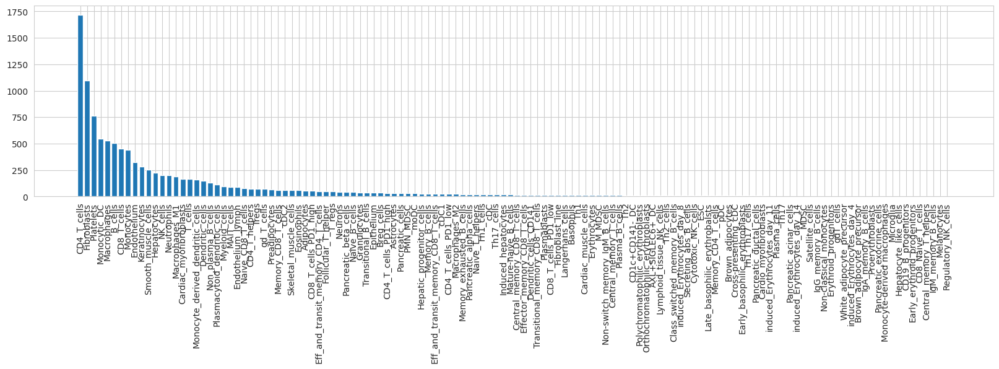

In [25]:
# a little bit of statistics
#example: which cell types do we have in public_cells_annot?
plt.figure(figsize=(20, 4))
x = public_cells_annot['Cell_type'].value_counts().sort_values(ascending=False)
plt.bar(range(len(x)), x)
plt.xticks(range(len(x)), x.index, rotation=90)
plt.show()

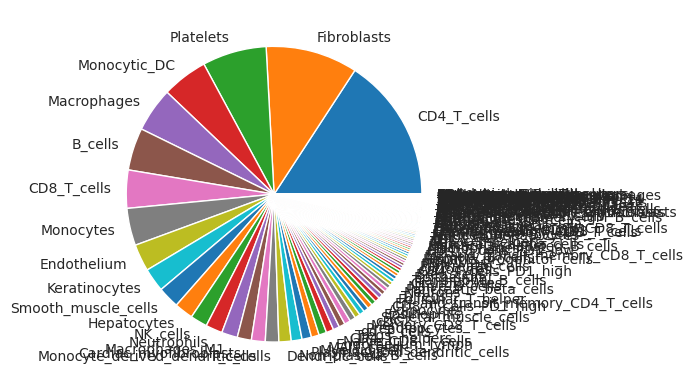

In [26]:
plt.pie(x, labels=x.index)
plt.show()

## read expressions

In [27]:
public_cells_expr = read_expressions(public_cells_annot)

no GSE183854 expression
no GSE199286 expression
no GSE162712 expression
no GSE199490 expression
no GSE214624 expression


In [28]:
public_cells_expr = np.log2(public_cells_expr+1)

In [74]:
get_hinting_flag()

32

## define custom signature

In [27]:
#signature_of_interest = '''MKI67	ESCO2	CETN3	CDK2	CCND1	CCNE1	AURKA	AURKB	E2F1	MYBL2	BUB1	PLK1	CCNB1	MCM2	MCM6'''.split('\t')
#OR
signature_of_interest = ['IFNG', 'GZMA', 'GZMB', 'PRF1', 'ZAP70', 'GNLY', 'FASLG', 'TBX21', 'EOMES', 'CD8A', 'GZMH']

#add here a custon signature name (as a first input)
signature_name = 'Effector_cells'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

In [28]:
public_cells_annot['Cell_type'].unique()

array(['Monocytes', 'gd_T_cells', 'T_cells', 'Fibroblasts', 'B_cells',
       'Endothelium', 'Th1_cells', 'Memory_B_cells', 'CD4_T_cells',
       'Macrophages', 'Hepatic_progenitor_cells', 'MAIT_cells',
       'CD8_T_cells', 'Mature_naive_B_cells', 'Transitional_B_cells',
       'Non_plasma_B_cells', 'Macrophages_M1', 'Dendritic_cells',
       'Monocytic_DC', 'Lymphoid_tissue_NK_cells', 'Memory_CD4_T_cells',
       'Tregs', 'CDC1', 'Central_memory_CD8_T_cells', 'Th17_cells',
       'Granulocytes', 'Neutrophils', 'Follicular_T_helper',
       'Naive_B_cells', 'Cardiac_myofibroblasts',
       'Eff_and_transit_memory_CD8_T_cells', 'CD8_T_cells_PD1_high',
       'Astrocytes', 'Plasmacytoid_dendritic_cells', 'NK_cells',
       'Th2_cells', 'Hepatocytes', 'Class_switched_memory_B_cells',
       'CD4_T_helpers', 'Induced_hepatocytes', 'Myeloid_cells', 'PDC',
       'Macrophages_M2', 'Naive_CD8_T_cells', 'Neurons', 'Eosinophils',
       'CD8_T_cells_PD1_low', 'Plasma_B_cells', 'Naive_T_helpers

## Validation itself

In [30]:
#define celltypes of interest
categories = ['NK_cells','CD8_T_cells','Naive_CD8_T_cells','CD4_T_cells', 'Central_memory_CD8_T_cells', 'Central_memory_CD4_T_cells','CD8_T_cells_PD1_high','CD8_T_cells_PD1_low', 'MAIT_cells',
            'gdT_cells','Th1_cells','Th2_cells','B_cells', 'Monocytes','CDC', 'PDC', 'Neutrophils','Eosinophils','Basophils','Fibroblasts','Endothelium' ]

#dataframe subsetting
annot = pd.DataFrame()
for i in categories:
    annot = pd.concat([annot, public_cells_annot.loc[public_cells_annot['Cell_type'].isin([i])]])

#for sorting in the required order, could be skipped if the sorting is not needed
annot.Cell_type = pd.Categorical(annot['Cell_type'],
                                    categories=categories,
                                    ordered=True)
annot = annot.sort_values('Cell_type')

In [31]:
subsampling_public = [i[1].sample(np.min([5, i[1].shape[0]])).index.tolist() for i in annot.groupby('Cell_type')]

In [32]:
subsampling_public = [item for sublist in subsampling_public for item in sublist]

<AxesSubplot:xlabel='Cell_type'>

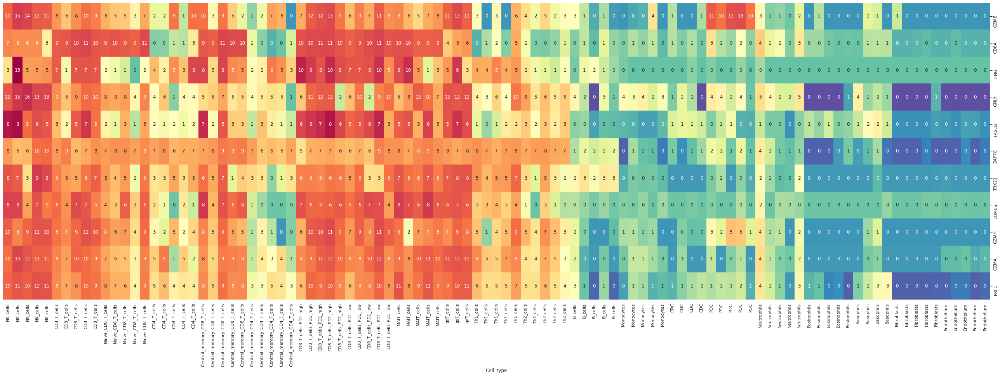

In [33]:
# A simple heatmap with log2 TPM of subsampled cells from celltypes of interest
genes_heatmap(
    public_cells_expr[subsampling_public],
    annot.reindex(subsampling_public)['Cell_type'],
    signature_of_interest,
    show_expression=True,
    highlight_genes=[],
    gene_highlight_lw=1,
    highlight_columns=[],
    col_highlight_color='blue',
    figsize=(45, 15),
    font_scale=1,
    show_indices=False,
    col_cluster=False,
    col_dendrogram=False,
    row_dendrogram=False)

ValueError: The number of FixedLocator locations (101), usually from a call to set_ticks, does not match the number of ticklabels (202).

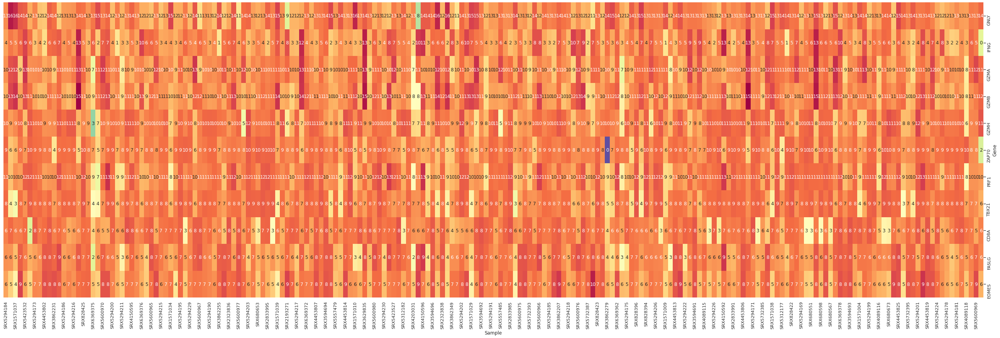

In [34]:
# A simple heatmap with log2 TPM of all cells of current celltype
c = ['NK_cells']
subsampling_public = annot[annot['Cell_type'].isin(c)].index

genes_heatmap(
    public_cells_expr[subsampling_public],
    annot.reindex(subsampling_public)['Cell_type'],
    signature_of_interest,
    show_expression=True,
    highlight_genes=[],
    gene_highlight_lw=1,
    highlight_columns=[],
    col_highlight_color='blue',
    figsize=(45, 15),
    font_scale=1,
    show_indices=False,
    col_cluster=False,
    col_dendrogram=False,
    row_dendrogram=False)

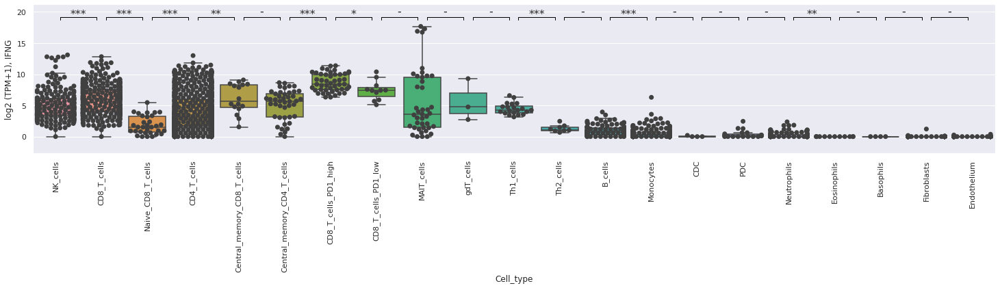

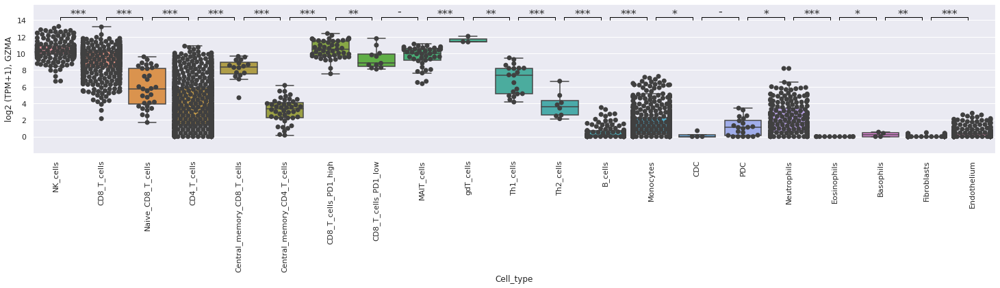

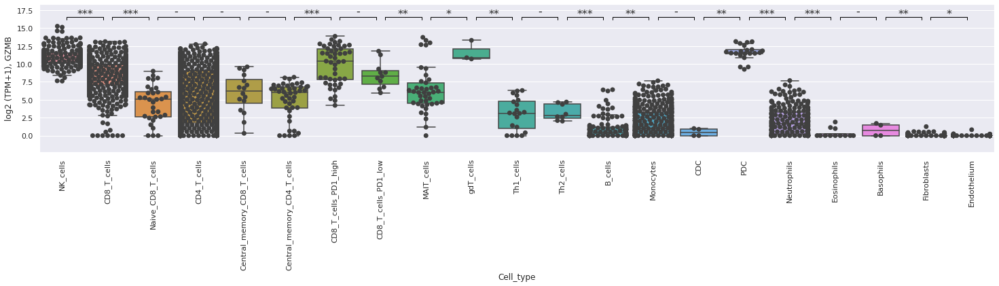

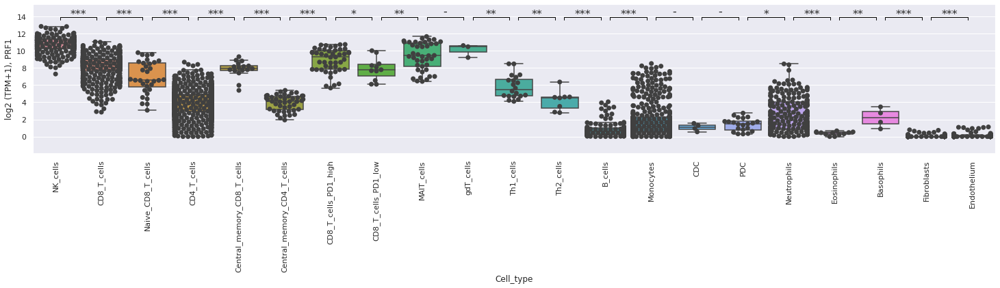

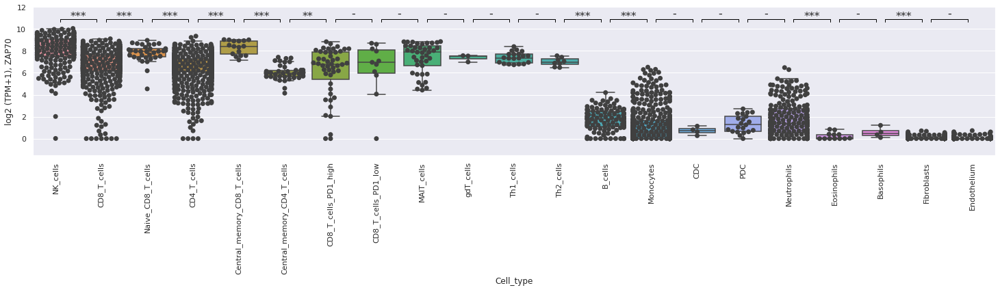

...

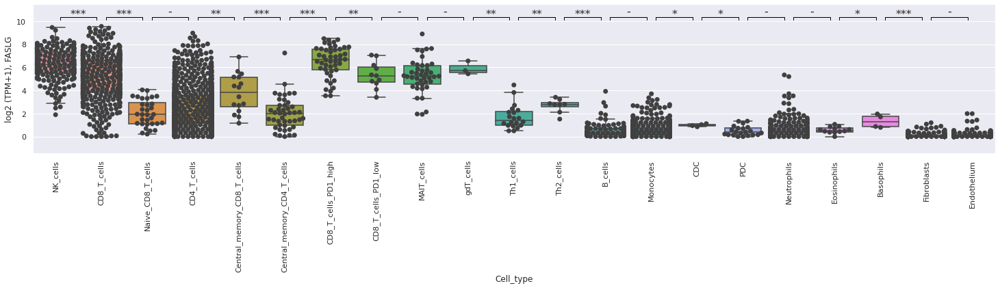

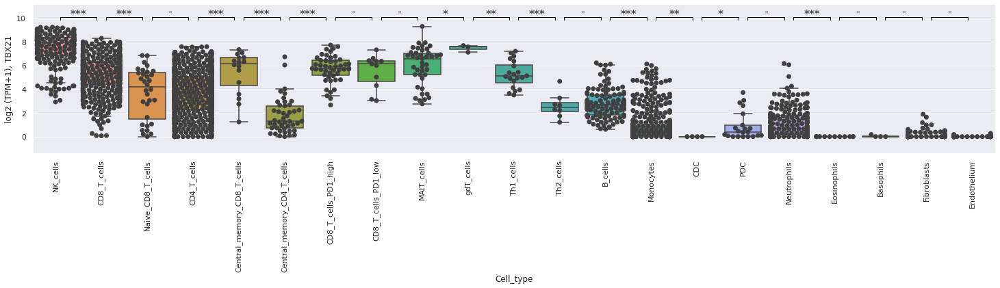

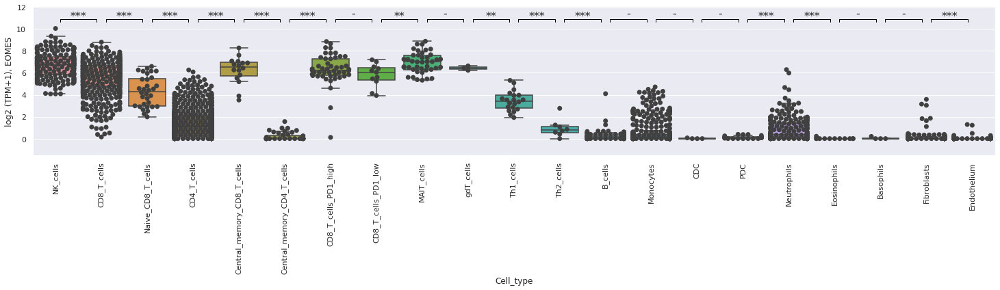

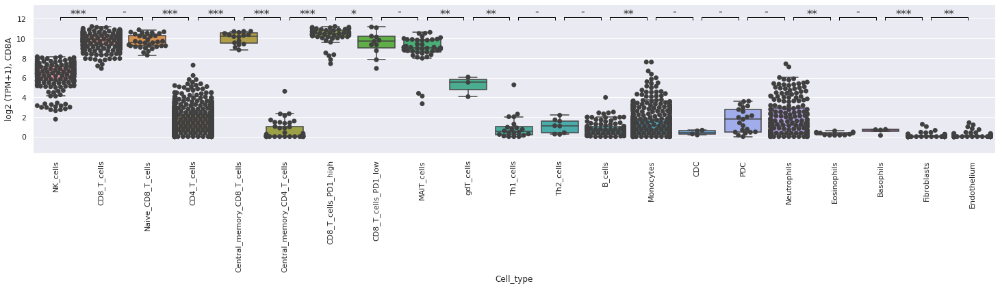

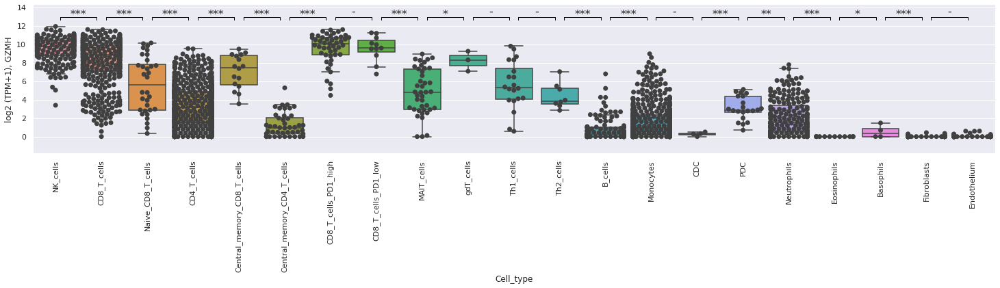

In [35]:
# boxplots depicting signature genes expression in celltypes of interest

categories = ['NK_cells','CD8_T_cells','Naive_CD8_T_cells','CD4_T_cells', 'Central_memory_CD8_T_cells', 'Central_memory_CD4_T_cells','CD8_T_cells_PD1_high','CD8_T_cells_PD1_low', 'MAIT_cells',
            'gdT_cells','Th1_cells','Th2_cells','B_cells', 'Monocytes','CDC', 'PDC', 'Neutrophils','Eosinophils','Basophils','Fibroblasts','Endothelium' ]

for gene in signature_of_interest:
    boxplot_with_pvalue(public_cells_expr.loc[gene], annot[annot['Cell_type'].isin(categories)]['Cell_type'],
                       order=categories)
    plt.ylabel(f'log2 (TPM+1), {gene}')
    plt.xticks(rotation=90)
    plt.show()

In [36]:
public_cells_ssgsea_unscaled = ssgsea_formula(public_cells_expr, gmt_genes_alt_names(geneset_of_interest, public_cells_expr.index, verbose=False)).T

In [37]:
x = public_cells_annot.groupby('Dataset')

public_cells_ssgsea_scaled = {}
for i in x:
    public_cells_ssgsea_scaled[i[0]] = median_scale(public_cells_ssgsea_unscaled.reindex(i[1].index))

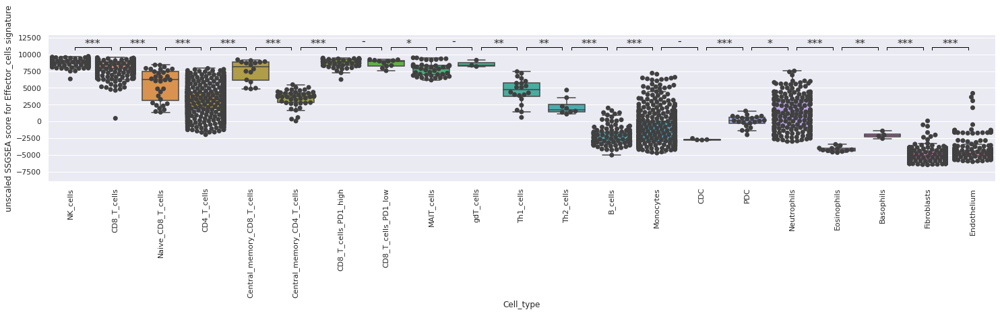

In [38]:
# boxplot depicting signature SSGSEA score in celltypes of interest (unscaled)

categories = ['NK_cells','CD8_T_cells','Naive_CD8_T_cells','CD4_T_cells', 'Central_memory_CD8_T_cells', 'Central_memory_CD4_T_cells','CD8_T_cells_PD1_high','CD8_T_cells_PD1_low', 'MAIT_cells',
            'gdT_cells','Th1_cells','Th2_cells','B_cells', 'Monocytes','CDC', 'PDC', 'Neutrophils','Eosinophils','Basophils','Fibroblasts','Endothelium' ]
boxplot_with_pvalue(public_cells_ssgsea_unscaled[signature_name], 
                    annot[annot['Cell_type'].isin(categories)]['Cell_type'], 
                   order = categories)

plt.xticks(rotation=90)
plt.ylabel(f'unscaled SSGSEA score for {signature_name} signature')
plt.show()

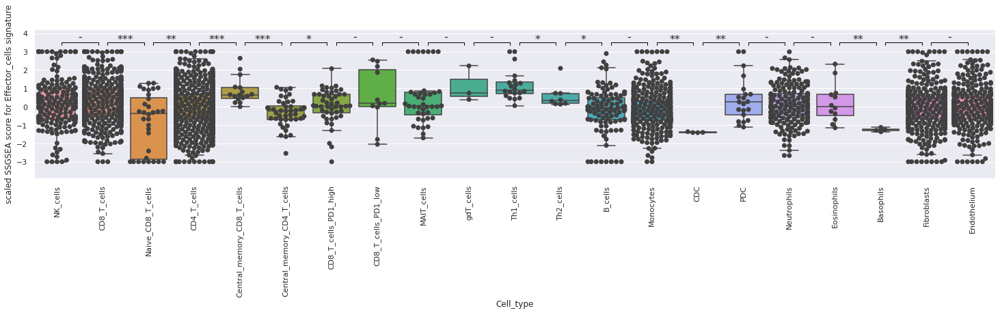

In [39]:
# boxplot depicting signature SSGSEA score in celltypes of interest (scaled)

categories = ['NK_cells','CD8_T_cells','Naive_CD8_T_cells','CD4_T_cells', 'Central_memory_CD8_T_cells', 'Central_memory_CD4_T_cells','CD8_T_cells_PD1_high','CD8_T_cells_PD1_low', 'MAIT_cells',
            'gdT_cells','Th1_cells','Th2_cells','B_cells', 'Monocytes','CDC', 'PDC', 'Neutrophils','Eosinophils','Basophils','Fibroblasts','Endothelium' ]

boxplot_with_pvalue(pd.concat(public_cells_ssgsea_scaled.values())[signature_name].clip(-3, 3), 
                    annot[annot['Cell_type'].isin(categories)]['Cell_type'], 
                   order = categories)

plt.xticks(rotation=90)
plt.ylabel(f'scaled SSGSEA score for {signature_name} signature')
plt.show()

# Signature validation: Sorted cells and cell lines from BG lab

## read anno

In [40]:
# Here we check which version of annotation is the newest - oldest directories go first
paths = sorted(Path('/uftp2/Databases/sorted_cell_databases/').iterdir(), key=os.path.getmtime)
paths

[PosixPath('/uftp2/Databases/sorted_cell_databases/jan2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/march2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/june2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/current_version')]

In [41]:
cells_clean = read_dataset('/uftp2/Databases/sorted_cell_databases/current_version/lab_clean_annotation.tsv')

NB: Клеточный тип из описания датасета обозначен в колонке Cell_type, однако бывает, 
    что более подробное описание образца содержится в колонке Cell_type_details. 
    Также есть колонка Deconvolution_cell_type, 
    в которой значению в колонке Cell_type по возможности сопоставляется такой клеточный тип, 
    для которого сейчас существует модель (https://bostongene.atlassian.net/wiki/spaces/TD/pages/3626696724/bulk+RNA-seq)

In [42]:
cells_clean = cells_clean[['Cell_type', 'Dataset', 'Sample']]

In [43]:
lab_cells_annot = cells_clean.copy()
lab_cells_annot = lab_cells_annot.reset_index(drop=True)

In [44]:
# split celltypes in case there are multiple celltypes per sample

celltypes_split = pd.DataFrame()

for i, j in lab_cells_annot.dropna(subset=['Cell_type']).iterrows():
    if ';' in j['Cell_type']:
        ct = j['Cell_type'].split(';')
        new_row = j.copy()
        for c in ct:
            new_row['Cell_type'] = c
            celltypes_split = celltypes_split.append(new_row, ignore_index=True)
        lab_cells_annot.drop(i, inplace=True)
        
lab_cells_annot = lab_cells_annot.append(celltypes_split)

In [45]:
lab_cells_annot.index = lab_cells_annot.Sample

## anno stats

In [46]:
pd.options.display.max_rows = len(lab_cells_annot['Cell_type'].value_counts())
lab_cells_annot['Cell_type'].value_counts()

Central_memory_T_helpers                       26
Total_live                                     22
Effector_memory_T_helpers                      21
CD4_T_cells                                    20
Tumor                                          18
Tfh_cells                                      17
Monocytes                                      17
CD206pos_Macrophages                           16
B_cells                                        13
Th1_CTL                                        12
CD206neg_Macrophages                           11
Th1_resting_cells                              10
Tregs                                           9
Th1_cells                                       9
Total_tumor_nonimmune                           9
Th17_resting_cells                              9
Fibroblasts_CD146+                              9
Naive_CD8_T_cells                               9
CD8_T_cells                                     9
CX3CR1+_PD1+_CD45RA-_Memory_CD8_T_cells         8


In [47]:
pd.options.display.max_rows = 10

In [48]:
lab_cells_annot.head()

,Cell_type,Dataset,Sample
Sample,,,
RNASeq-normal-201202_Next_Sample2,Classical_monocytes,RNASeq-normal-201202_Next_Sample2_dataset,RNASeq-normal-201202_Next_Sample2
RNASeq-normal-201202_Next_Sample3,B_cells,RNASeq-normal-201202_Next_Sample3_dataset,RNASeq-normal-201202_Next_Sample3
RNASeq-normal-201202_Next_Sample4,CD4_T_cells,RNASeq-normal-201202_Next_Sample4_dataset,RNASeq-normal-201202_Next_Sample4
RNASeq-normal-201202_Next_Sample5,Central_memory_CD4_T_cells,RNASeq-normal-201202_Next_Sample5_dataset,RNASeq-normal-201202_Next_Sample5
RNASeq-normal-201202_Next_Sample6,Effector_memory_CD4_T_cells,RNASeq-normal-201202_Next_Sample6_dataset,RNASeq-normal-201202_Next_Sample6


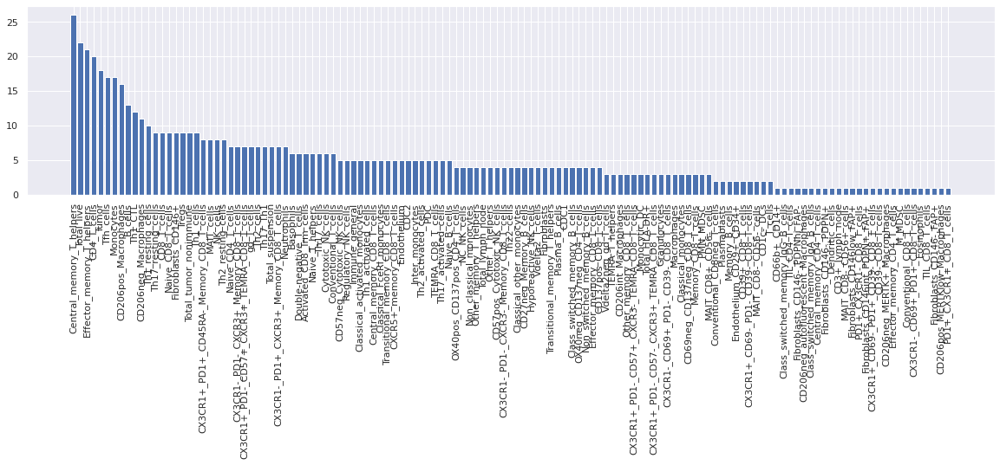

In [49]:
# a little bit of statistics
#example: which cell types do we have in lab_cells_annot?
plt.figure(figsize=(20, 4))
x = lab_cells_annot['Cell_type'].value_counts().sort_values(ascending=False)
plt.bar(range(len(x)), x)
plt.xticks(range(len(x)), x.index, rotation=90)
plt.show()

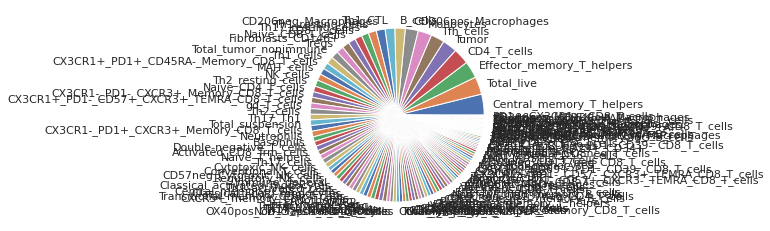

In [50]:
plt.pie(x, labels=x.index)
plt.show()

## read expressions

In [51]:
lab_cells_expr = read_expressions(lab_cells_annot)

no RNASeq-tumor-220316_NovaB_Sample_17_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_19_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_22_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_25_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_27_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_28_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_29_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_31_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_34_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_35_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_38_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_39_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_42_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_43_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_44_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_45_dataset expression
no RNASeq-tumor-220316_NovaB_Sample_46_dataset expression
no RNASeq-tumo

In [52]:
lab_cells_expr = np.log2(lab_cells_expr+1)

In [53]:
lab_cells_expr = lab_cells_expr[~lab_cells_expr.index.duplicated()]

## define custom signature

In [54]:
#signature_of_interest = '''IGKC	IGHM	IGHD	MZB1	JCHAIN	CD38	POU2AF1	TNFRSF17	CD27	SIK1	EAF2	HLA-DOB	MAN1A1'''.split('\t')
#OR
signature_of_interest = ['IFNG', 'GZMA', 'GZMB', 'PRF1', 'ZAP70', 'GNLY', 'FASLG', 'TBX21', 'EOMES', 'CD8A', 'GZMH']

#add here a custon signature name
signature_name = 'Effector_cells'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

In [55]:
lab_cells_annot['Cell_type'].unique()

array(['Classical_monocytes', 'B_cells', 'CD4_T_cells',
       'Central_memory_CD4_T_cells', 'Effector_memory_CD4_T_cells',
       'Monocytes', 'Tregs', 'Tfh_cells', 'Th17_cells', 'Th17_Th1',
       'Th1_CTL', 'Th1_cells', 'Other_T_helpers', 'Neutrophils',
       'Eosinophils', 'PDC', 'Non_classical_monocytes', 'Inter_monocytes',
       'Classical_FceRI_monocytes', 'Classical_activated_monocytes',
       'Th2_cells', 'Naive_CD8_T_cells',
       'CX3CR1+_PD1+_CD45RA-_Memory_CD8_T_cells',
       'CX3CR1+_PD1-_CD57+_CXCR3+_TEMRA_CD8_T_cells',
       'CX3CR1-_PD1+_CXCR3+_Memory_CD8_T_cells',
       'CX3CR1-_PD1-_CXCR3+_Memory_CD8_T_cells',
       'Activated_CD8_Trm_cells', 'T_cells', 'CD8_T_cells',
       'CX3CR1-_PD1-_CXCR3-_Memory_CD8_T_cells', 'Total_suspension',
       'Tumor', 'PMN_MDSC', 'M_MDSC', 'TIL_CD4_T_cells',
       'TIL_CD8_T_cells', 'Naive_B_cells', 'Non_switched_memory_B_cells',
       'Class_switched_memory_IgG_B_cells',
       'Class_switched_memory_IgA_B_cells', 'Naive_T

## Validation itself

In [56]:
#define celltypes of interest
categories = ['NK_cells','CD8_T_cells','Naive_CD8_T_cells','CD4_T_cells', 'Central_memory_CD8_T_cells', 'Central_memory_CD4_T_cells','Effector_memory_CD8_T_cells','Effector_memory_CD4_T_cells','MAIT_cells',
            'gd_T_cells','Th1_cells','Th2_cells','B_cells', 'Monocytes', 'CDC1', 'CDC2','PDC', 'Neutrophils','Eosinophils','Basophils','Fibroblasts','Endothelium']

#dataframe subsetting
annot = pd.DataFrame()
for i in categories:
    annot = pd.concat([annot, lab_cells_annot.loc[lab_cells_annot['Cell_type'].isin([i])]])

#for sorting in the required order, could be skipped if the sorting is not needed
annot.Cell_type = pd.Categorical(annot['Cell_type'],
                                    categories=categories,
                                    ordered=True)
annot = annot.sort_values('Cell_type')

In [57]:
subsampling_lab = [i[1].sample(np.min([5, i[1].shape[0]])).index.tolist() for i in annot.groupby('Cell_type')]

In [58]:
subsampling_lab = [item for sublist in subsampling_lab for item in sublist]

In [59]:
# A simple heatmap with log2 TPM of subsampled cells from celltypes of interest
genes_heatmap(
    lab_cells_expr[subsampling_lab],
    annot.reindex(subsampling_lab)['Cell_type'],
    signature_of_interest,
    show_expression=True,
    highlight_genes=[],
    gene_highlight_lw=1,
    highlight_columns=[],
    col_highlight_color='blue',
    figsize=(45, 15),
    font_scale=1,
    show_indices=False,
    col_cluster=False,
    col_dendrogram=False,
    row_dendrogram=False)

KeyError: "['RNASeq-tumor-220324_NovaA_Sample_72', 'RNASeq-tumor-220316_NovaB_Sample_19', 'RNASeq-tumor-220428_NovaA_Sample_7'] not in index"

<AxesSubplot:xlabel='Cell_type'>

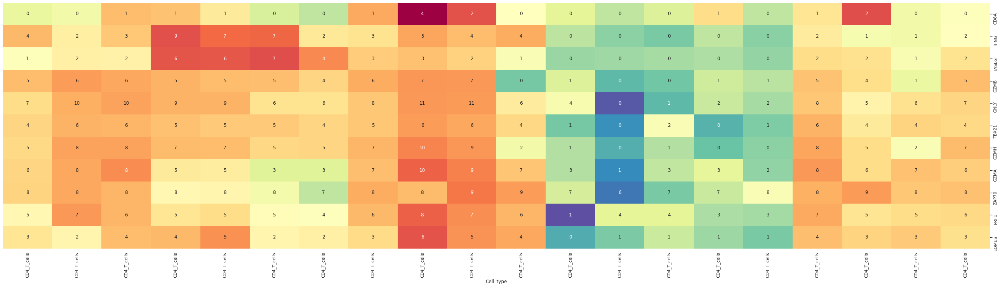

In [60]:
# A simple heatmap with log2 TPM of all cells of current celltype
c = ['CD4_T_cells']
subsampling_lab = annot[annot['Cell_type'].isin(c)].index

genes_heatmap(
    lab_cells_expr[subsampling_lab],
    annot.reindex(subsampling_lab)['Cell_type'],
    signature_of_interest,
    show_expression=True,
    highlight_genes=[],
    gene_highlight_lw=1,
    highlight_columns=[],
    col_highlight_color='blue',
    figsize=(45, 15),
    font_scale=1,
    show_indices=False,
    col_cluster=False,
    col_dendrogram=False,
    row_dendrogram=False)

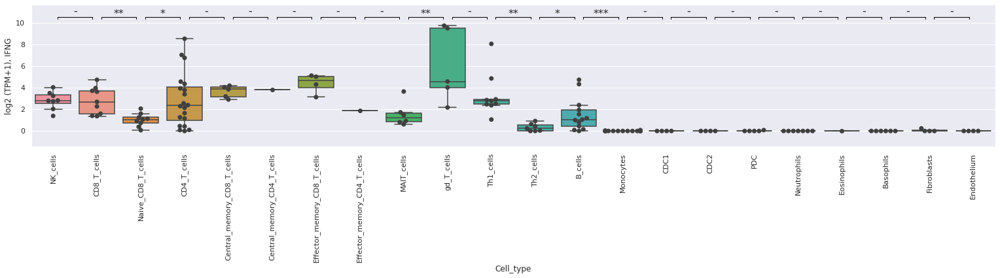

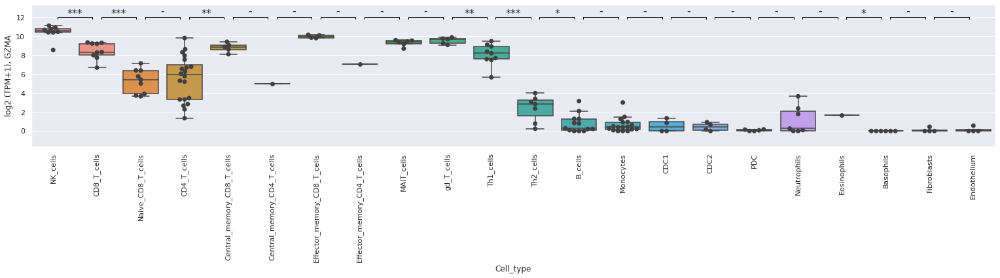

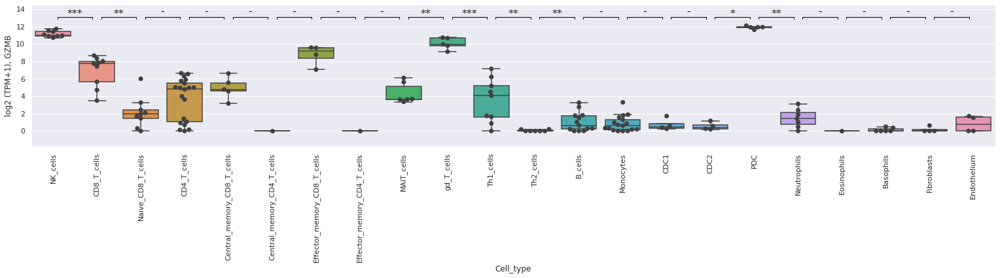

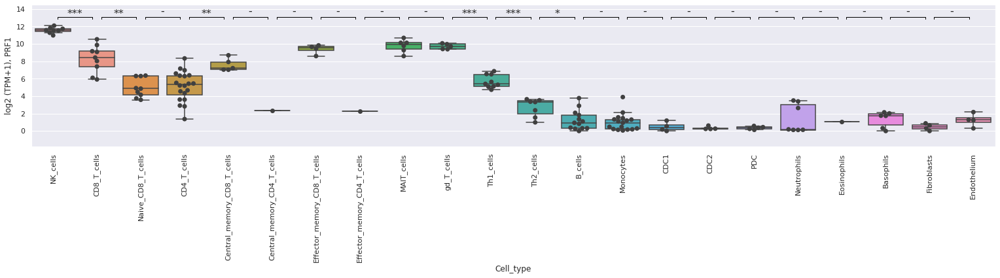

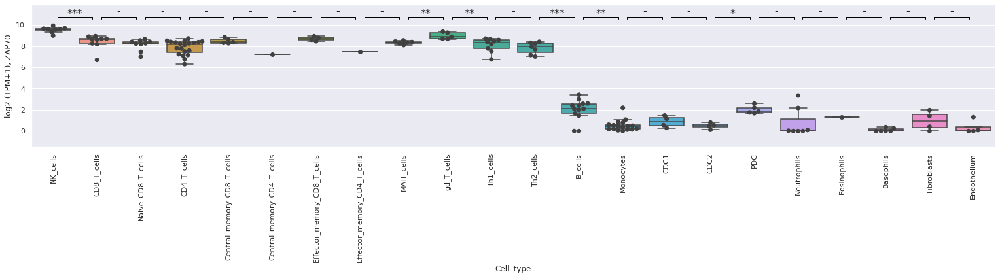

...

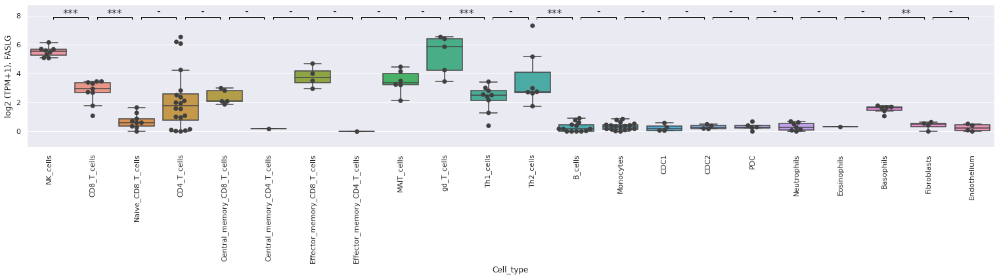

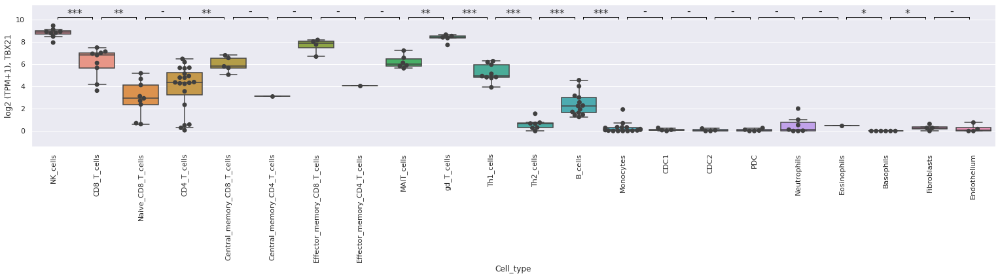

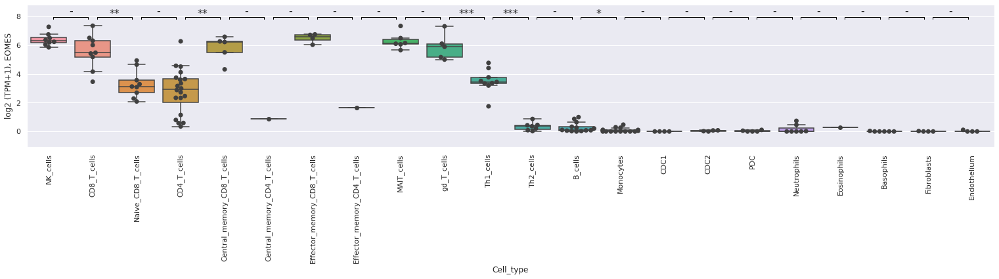

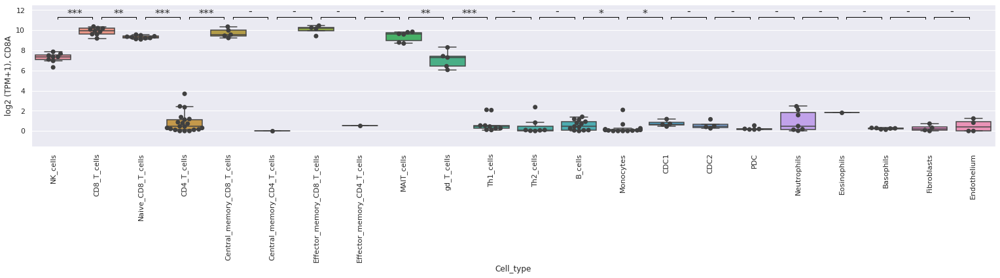

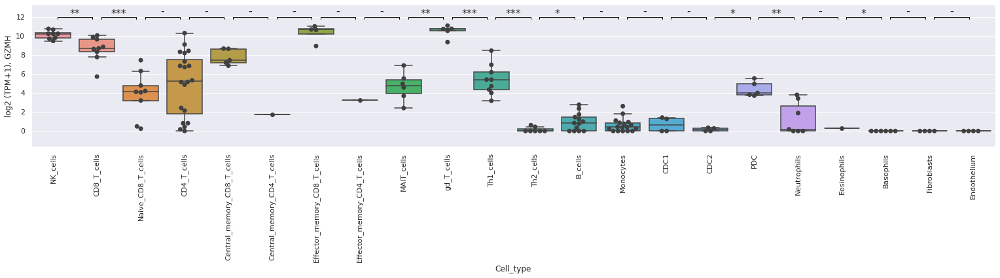

In [61]:
# boxplots depicting signature genes expression in celltypes of interest

categories = ['NK_cells','CD8_T_cells','Naive_CD8_T_cells','CD4_T_cells', 'Central_memory_CD8_T_cells', 'Central_memory_CD4_T_cells','Effector_memory_CD8_T_cells','Effector_memory_CD4_T_cells','MAIT_cells',
            'gd_T_cells','Th1_cells','Th2_cells','B_cells', 'Monocytes', 'CDC1', 'CDC2','PDC', 'Neutrophils','Eosinophils','Basophils','Fibroblasts','Endothelium']
for gene in signature_of_interest:
    boxplot_with_pvalue(lab_cells_expr.loc[gene], annot[annot['Cell_type'].isin(categories)]['Cell_type'],order=categories)
    plt.ylabel(f'log2 (TPM+1), {gene}')
    plt.xticks(rotation=90)
    plt.show()

In [62]:
lab_cells_ssgsea_unscaled = ssgsea_formula(lab_cells_expr, 
                                           gmt_genes_alt_names(geneset_of_interest, 
                                                                        lab_cells_expr.index, verbose=False)).T

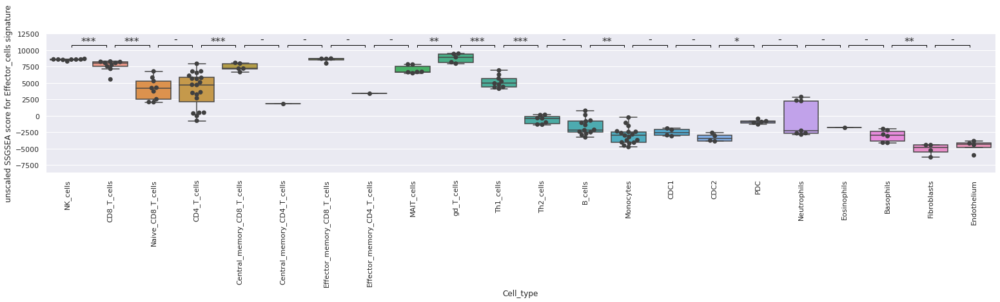

In [63]:
# boxplot depicting signature SSGSEA score in celltypes of interest (unscaled)

categories = ['NK_cells','CD8_T_cells','Naive_CD8_T_cells','CD4_T_cells', 'Central_memory_CD8_T_cells', 'Central_memory_CD4_T_cells','Effector_memory_CD8_T_cells','Effector_memory_CD4_T_cells','MAIT_cells',
            'gd_T_cells','Th1_cells','Th2_cells','B_cells', 'Monocytes', 'CDC1', 'CDC2','PDC', 'Neutrophils','Eosinophils','Basophils','Fibroblasts','Endothelium'             
]

boxplot_with_pvalue(lab_cells_ssgsea_unscaled[signature_name], annot[annot['Cell_type'].isin(categories)]['Cell_type'], 
                   order = categories)

plt.xticks(rotation=90)
plt.ylabel(f'unscaled SSGSEA score for {signature_name} signature')
plt.show()

# Signature validation: Cancer cell lines

## read anno

In [64]:
# Here we check which version of annotation is the newest - oldest directories go first
paths = sorted(Path('/uftp2/Databases/sorted_cell_databases/').iterdir(), key=os.path.getmtime)
paths

[PosixPath('/uftp2/Databases/sorted_cell_databases/jan2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/march2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/june2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/current_version')]

In [65]:
cells_clean = read_dataset('/uftp2/Databases/sorted_cell_databases/current_version/cancer_cell_lines_all_annotation.tsv')

In [66]:
cells_clean = cells_clean[['Tumor_type', 'Dataset', 'Sample', 'Therapy']]

In [67]:
cancer_cells_annot = cells_clean.copy()

## anno stats

In [68]:
pd.options.display.max_rows = len(cancer_cells_annot['Tumor_type'].value_counts())
cancer_cells_annot['Tumor_type'].value_counts()

Lung_Adenocarcinoma                                  886
Prostate_Cancer                                      553
Pancreatic_Ductal_Adenocarcinoma                     269
Melanoma                                             247
Invasive_Breast_Carcinoma                            188
Acute_Myeloid_Leukemia                               186
EBV-B_cells                                          185
Large_Cell_Lung_Carcinoma                            181
Diffuse_Large_B_Cell_Lymphoma                        176
Mantle_Cell_Lymphoma                                 167
Cutaneous_Melanoma                                   126
Squamous_Cell_Carcinoma_of_the_Head_and_Neck         121
Chronic_Lymphocytic_Leukemia                         114
Colon_Adenocarinoma                                  102
Breast_Adenocarcinoma                                 95
Colon_Carinoma                                        94
Breast_Neoplasm                                       87
Glioblastoma                   

In [69]:
pd.options.display.max_rows = 10

In [70]:
cancer_cells_annot.head()

,Tumor_type,Dataset,Sample,Therapy
SRX4143039,Small_Cell_Lung_Carcinoma,GSE115122,SRX4143039,Without_therapy
SRX2495594,Diffuse_Large_B_Cell_Lymphoma,GSE93675,SRX2495594,Without_therapy
SRX3506075,Lung_Adenocarcinoma,GSE108464,SRX3506075,Without_therapy
SRX2314325,Diffuse_Large_B_Cell_Lymphoma,GSE89339,SRX2314325,Without_therapy
SRX2035865,Multiple_Myeloma,GSE85840,SRX2035865,Without_therapy


In [71]:
pd.crosstab(cancer_cells_annot.Tumor_type, cancer_cells_annot.Therapy)

Therapy,BRAFi,BRAFi+MEKi,BTK inhibitor (Ibrutinib),Day_10_of_PBS,Day_10_of_Ribavarin_80mg/kg/twice daily intraperitoneally,Lck inhibitor,No_data,Without_therapy,previously treated for non-Hodgkin lymphoma (NHL),"rituximab dosed 25 mg/kg, three times a week over 21 days."
Tumor_type,,,,,,,,,,
Acute_Erythroid_Leukemia,0,0,0,0,0,0,6,0,0,0
Acute_Lymphoblastic_Leukemia,0,0,0,0,0,0,0,42,0,0
Acute_Monocytic_Leukemia,0,0,0,0,0,0,0,20,0,0
Acute_Myeloid_Leukemia,0,0,0,0,0,0,0,186,0,0
Adenosquamous_Cell_Lung_Carcinoma,0,0,0,0,0,0,0,4,0,0
...,...,...,...,...,...,...,...,...,...,...
hESC,0,0,0,0,0,0,1,0,0,0
mesenchymal stem cells day 1,0,0,0,0,0,0,1,0,0,0
mesenchymal stem cells day 3,0,0,0,0,0,0,1,0,0,0


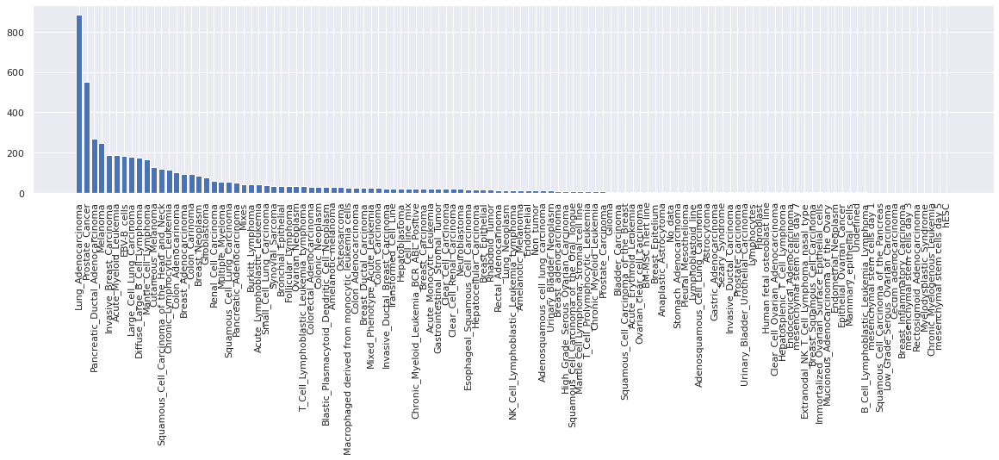

In [72]:
# a little bit of statistics
#example: which cell types do we have in cancer_cells_annot?
plt.figure(figsize=(20, 4))
x = cancer_cells_annot['Tumor_type'].value_counts().sort_values(ascending=False)
plt.bar(range(len(x)), x)
plt.xticks(range(len(x)), x.index, rotation=90)
plt.show()

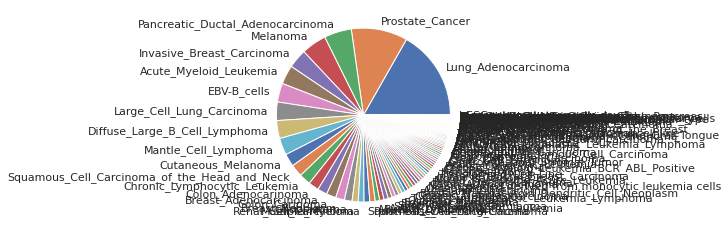

In [73]:
plt.pie(x, labels=x.index)
plt.show()

## read expressions

In [74]:
cancer_cells_expr = read_expressions(cancer_cells_annot)

In [75]:
cancer_cells_expr = np.log2(cancer_cells_expr+1)

## define custom signature

In [66]:
#signature_of_interest = '''IGKC	IGHM	IGHD	MZB1	JCHAIN	CD38	POU2AF1	TNFRSF17	CD27	SIK1	EAF2	HLA-DOB	MAN1A1'''.split('\t')
#OR
signature_of_interest = ['IFNG', 'GZMA', 'GZMB', 'PRF1', 'ZAP70', 'GNLY', 'FASLG', 'TBX21', 'EOMES', 'CD8A', 'GZMH']

#add here a custon signature name
signature_name = 'Effector cells'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

## Validation itself

In [70]:
#define diagnoses of interest
categories = ['Diffuse_Large_B_Cell_Lymphoma', 'Glioma','Non_tumor']

#dataframe subsetting
annot = pd.DataFrame()
for i in categories:
    annot = pd.concat([annot, cancer_cells_annot.loc[cancer_cells_annot['Tumor_type'].isin([i])]])

#for sorting in the required order, could be skipped if the sorting is not needed
annot.Cell_type = pd.Categorical(annot.Tumor_type,
                                    categories=categories,
                                    ordered=True)
annot = annot.sort_values('Tumor_type')

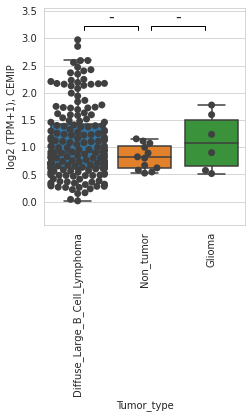

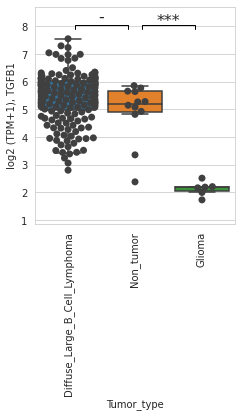

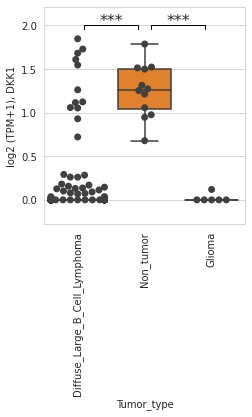

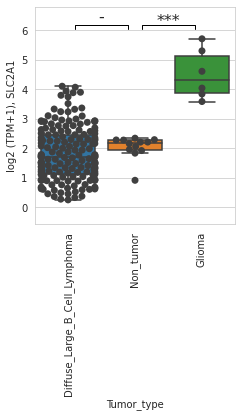

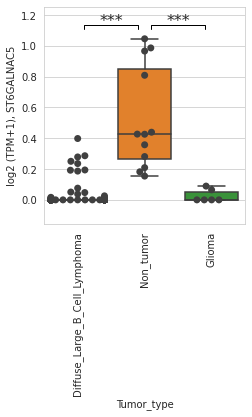

...

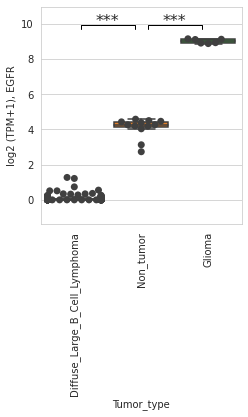

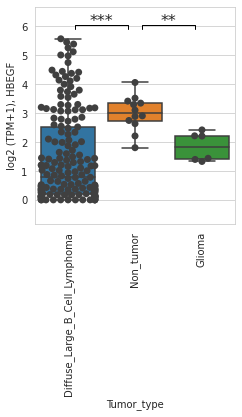

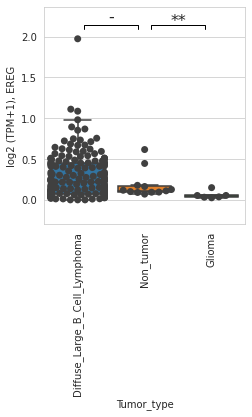

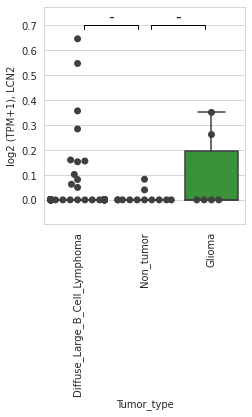

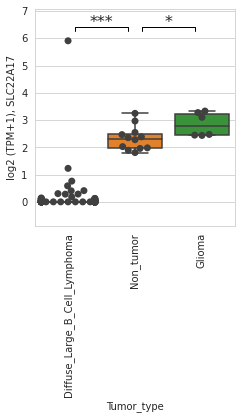

In [71]:
# boxplots depicting signature genes expression in diagnoses of interest

categories = ['Diffuse_Large_B_Cell_Lymphoma', 'Glioma','Non_tumor']

for gene in signature_of_interest:
    boxplot_with_pvalue(cancer_cells_expr.loc[gene], annot[annot['Tumor_type'].isin(categories)]['Tumor_type'])
    plt.ylabel(f'log2 (TPM+1), {gene}')
    plt.xticks(rotation=90)
    plt.show()

In [72]:
cancer_cells_ssgsea_unscaled = ssgsea_formula(cancer_cells_expr, gmt_genes_alt_names(geneset_of_interest, cancer_cells_expr.index, verbose=False)).T

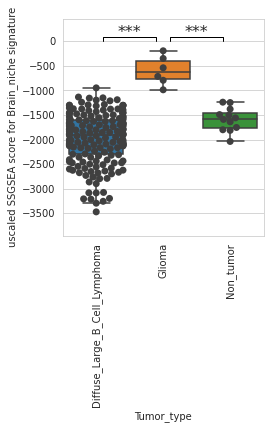

In [73]:
# boxplot depicting signature SSGSEA score in celltypes of interest

categories = ['Diffuse_Large_B_Cell_Lymphoma', 'Glioma','Non_tumor'           
]

boxplot_with_pvalue(cancer_cells_ssgsea_unscaled[signature_name], annot[annot['Tumor_type'].isin(categories)]['Tumor_type'], 
                   order = categories)

plt.xticks(rotation=90)
plt.ylabel(f'uscaled SSGSEA score for {signature_name} signature')
plt.show()

# Signature validation: Blood db

## read anno

In [102]:
# Here we check which version of annotation is the newest - oldest directories go first
paths = sorted(Path('/uftp2/Databases/sorted_cell_databases/').iterdir(), key=os.path.getmtime)
paths

[PosixPath('/uftp2/Databases/sorted_cell_databases/jan2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/march2022'),
 PosixPath('/uftp2/Databases/sorted_cell_databases/current_version')]

In [103]:
cells_clean = read_dataset('/uftp2/Databases/sorted_cell_databases/current_version/blood_all_annotation.tsv')

In [104]:
cells_clean.head()

,Readcounts,Sample,Dataset,Sample_type,Sample_type_details,Tissue_stimulation,Therapy_type,Globin_depletion_kit,Freezing,Diagnosis
SRX4780433,26449327.00,SRX4780433,GSE120691,Whole_blood,NaN,Without_stimulation,Without_therapy,No_data,-80,Healthy
SRX11208168,4274732.00,SRX11208168,GSE178757,Whole_blood,NaN,Hour_24 _of_SARS-CoV-2 peptide NP1_2 ug/mL(80u...,No_data,No_data,No,COVID-19
SRX6368870,683021.30,SRX6368870,GSE133378,Whole_blood,NaN,Without_stimulation,No_data,GlobinLock,No_data,Juvenile_idiopathic_arthritis
SRX10280085,5650398.00,SRX10280085,GSE168519,Whole_blood,NaN,Without_stimulation,No_data,No_data,No_data,"Tuberculosis, HIV"
SRX2683349,19434751.02,SRX2683349,GSE97158,Whole_blood,NaN,Without_stimulation,25000 infectious Plasmodium falciparum sporozo...,GLOBINclear (Thermo Fisher Scientific),-80,Controlled_human_malaria_infection


In [105]:
blood_annot = cells_clean.copy()

In [106]:
blood_annot = blood_annot[~blood_annot.index.duplicated()]

## Definition of custom signature (once again, same as above)

In [107]:
signature_of_interest = '''MKI67	ESCO2	CETN3	CDK2	CCND1	CCNE1	AURKA	AURKB	E2F1	MYBL2	BUB1	PLK1	CCNB1	MCM2	MCM6'''.split('\t')
#OR
#signature_of_interest = ['IGLL3P', 'IGKC']

#add here a custon signature name (as a first input)
signature_name = 'Proliferation rate'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

In [108]:
# подсчет колличества образцов разных диагнозов в blood db
available_diagnoses = blood_annot.Diagnosis.unique()
with pd.option_context('display.max_rows', None):
    display(blood_annot.Diagnosis.value_counts())

Healthy                                                                      11483
Tuberculosis                                                                  2134
COVID-19                                                                      1203
Type_1_diabetes_mellitus                                                      1068
Systemic_lupus_erythematosus                                                   818
Asthma                                                                         725
Post-traumatic_stress_disorder                                                 448
HIV                                                                            380
Rheumatoid_arthritis                                                           350
Sepsis                                                                         318
Controlled_human_malaria_infection                                             289
Juvenile_idiopathic_arthritis                                                  268
Zika

In [109]:
blood_annot.index = blood_annot['Sample']

In [204]:
blood_annot.shape

(27899, 10)

In [196]:
blood_annot.Dataset.value_counts()

GSE89403                                       901
GSE157657                                      760
GSE103401                                      670
GSE96783                                       513
GSE115823                                      511
                                              ... 
GSE144792                                        2
GSE80126                                         1
RNASeq-normal-201214_NovaA_Sample37_dataset      1
RNASeq-normal-201214_NovaA_Sample36_dataset      1
GSE181689                                        1
Name: Dataset, Length: 455, dtype: int64

In [124]:
#diagnoses to compare
diagnoses = ['Psoriasis', 'Liver_Neoplasm', 'Breast_Neoplasm', 'Healthy']

In [125]:
# подгружаем экспрессии для blood db
blood_expressions = {}
for d in diagnoses:
    if d not in blood_expressions.keys():
        blood_expressions[d] = np.log2(read_expressions(blood_annot[blood_annot['Diagnosis'] == d]) + 1)

## Validation itself

Signature name: Proliferation rate
Diagnosis(es): Psoriasis


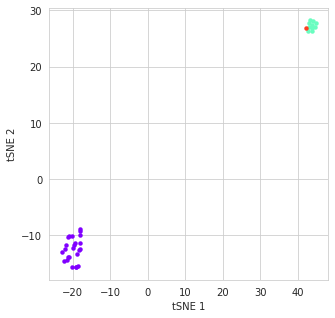

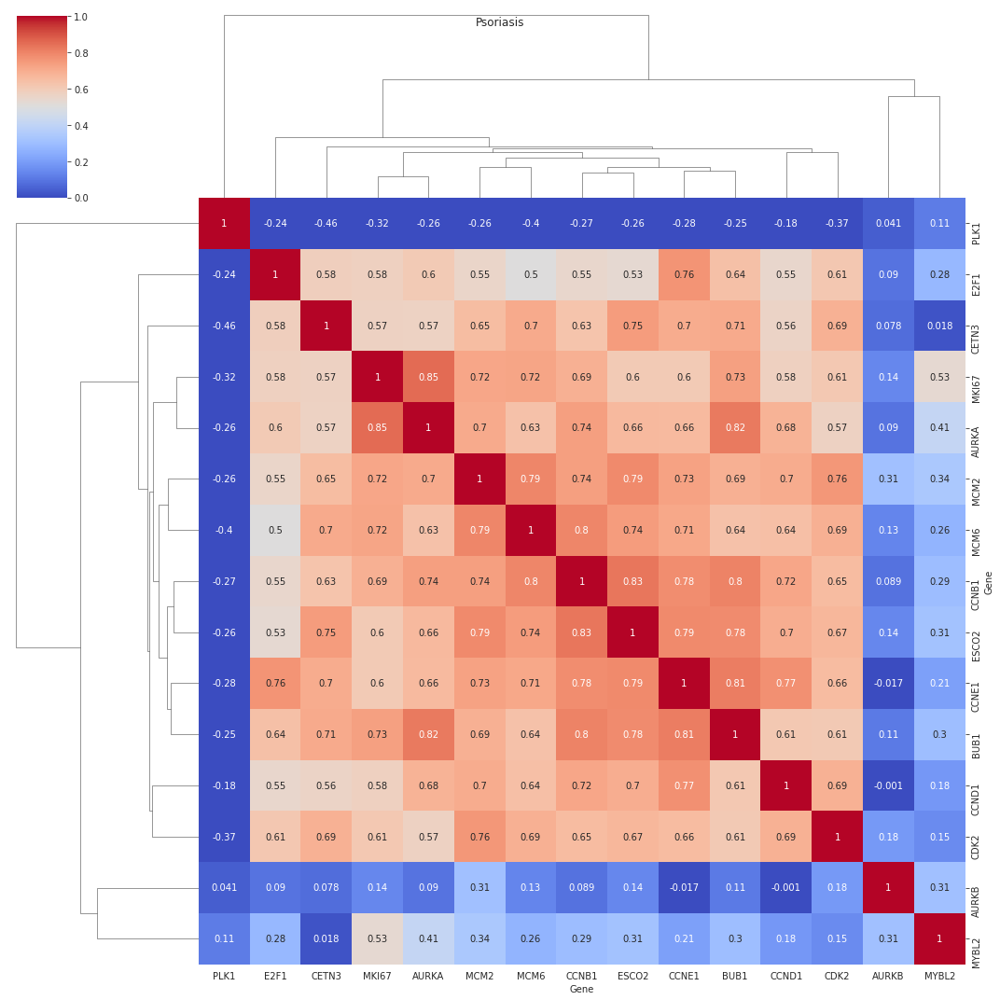

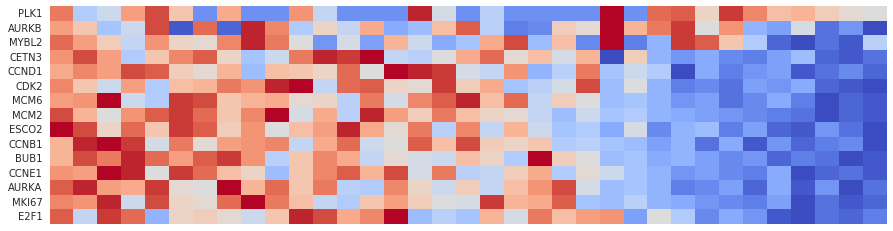

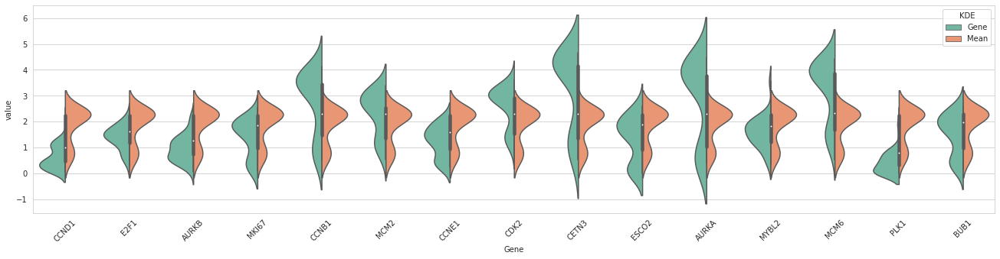

Diagnosis(es): Liver_Neoplasm


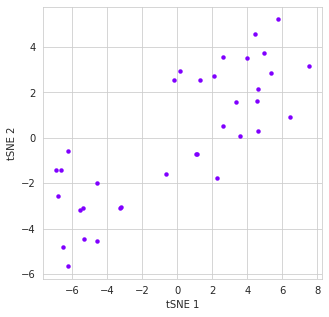

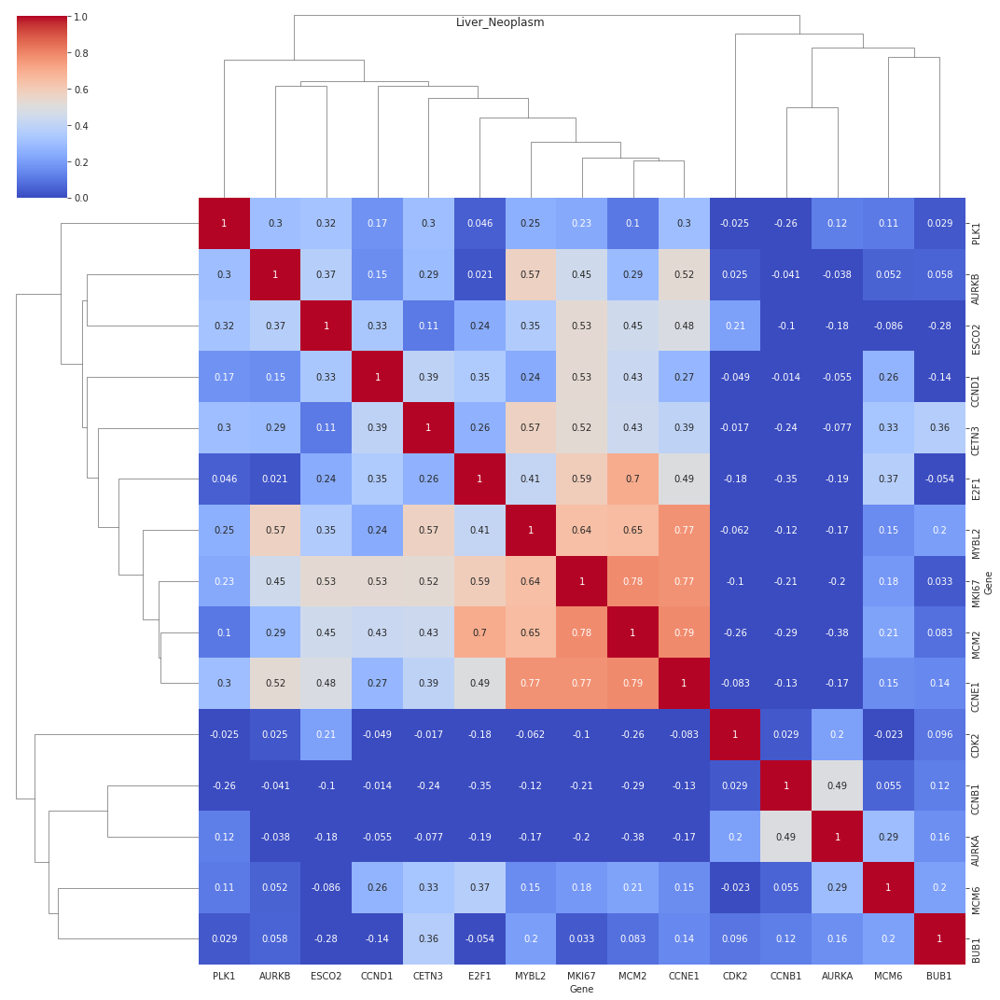

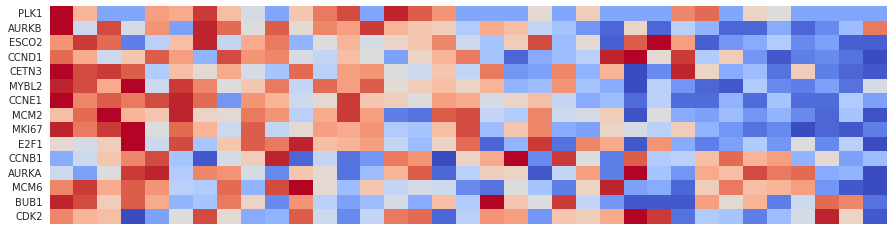

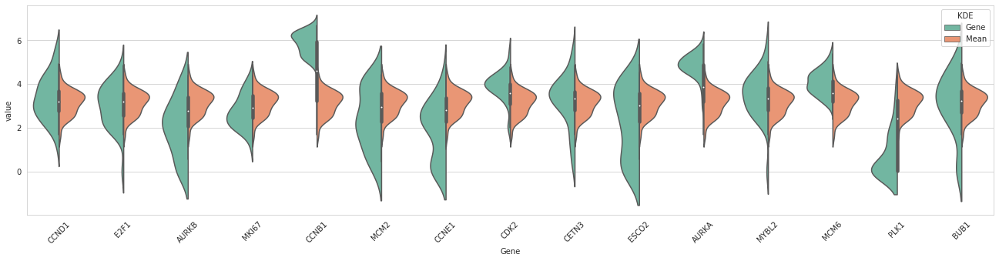

Diagnosis(es): Breast_Neoplasm


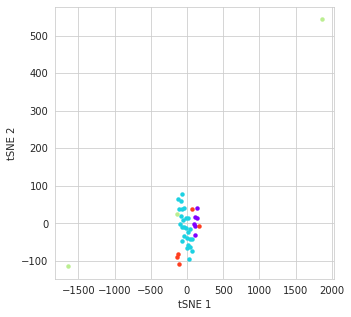

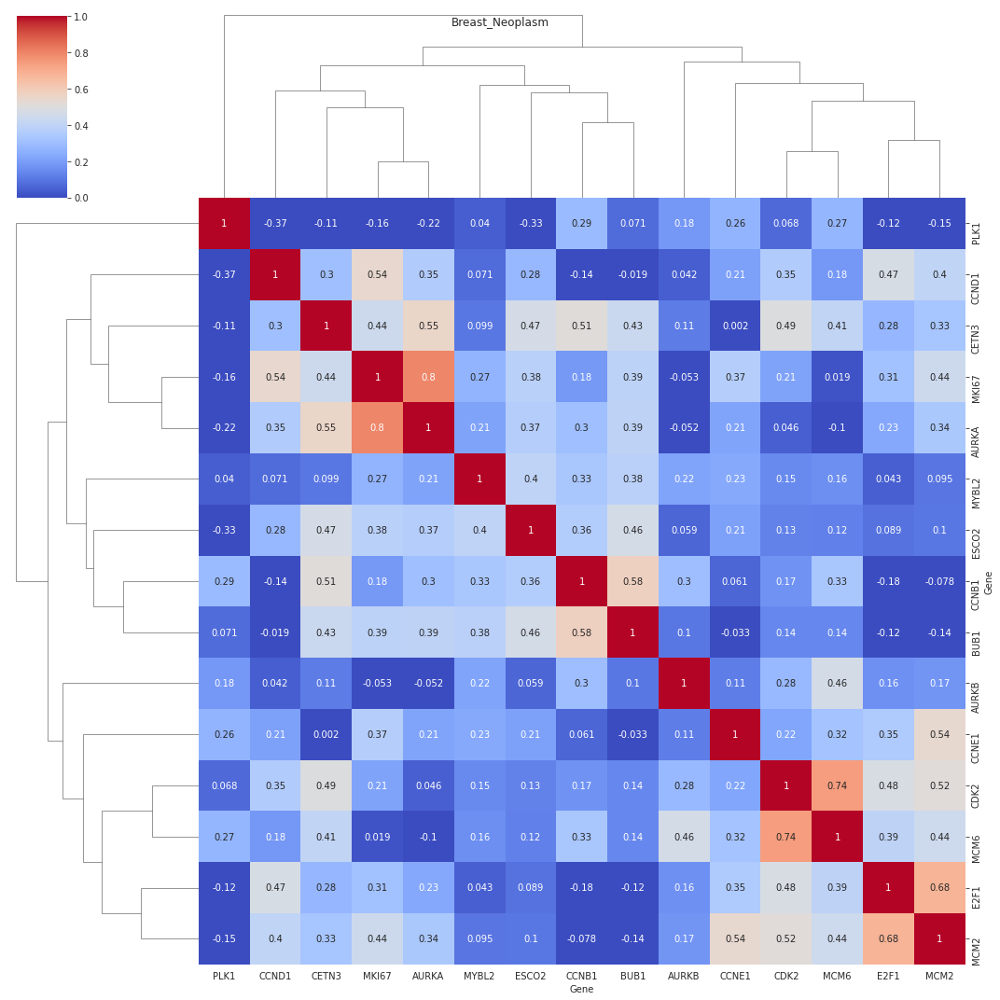

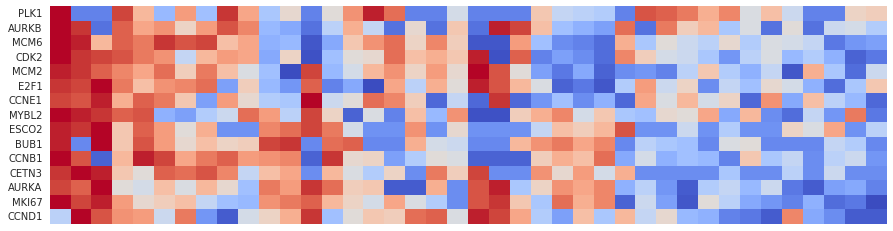

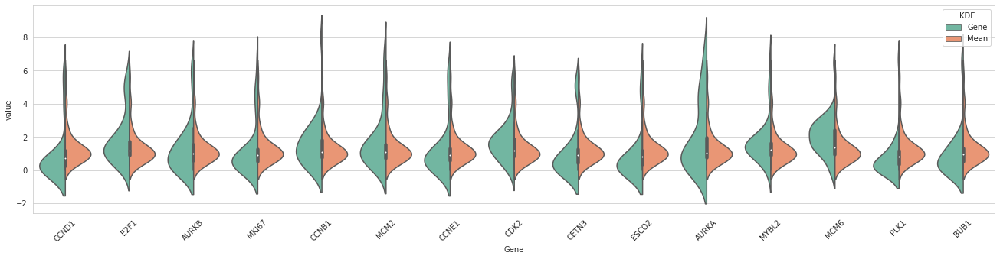

Diagnosis(es): Healthy


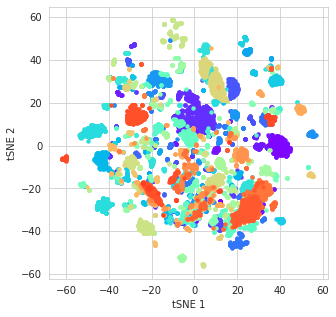

ValueError: cannot reindex from a duplicate axis

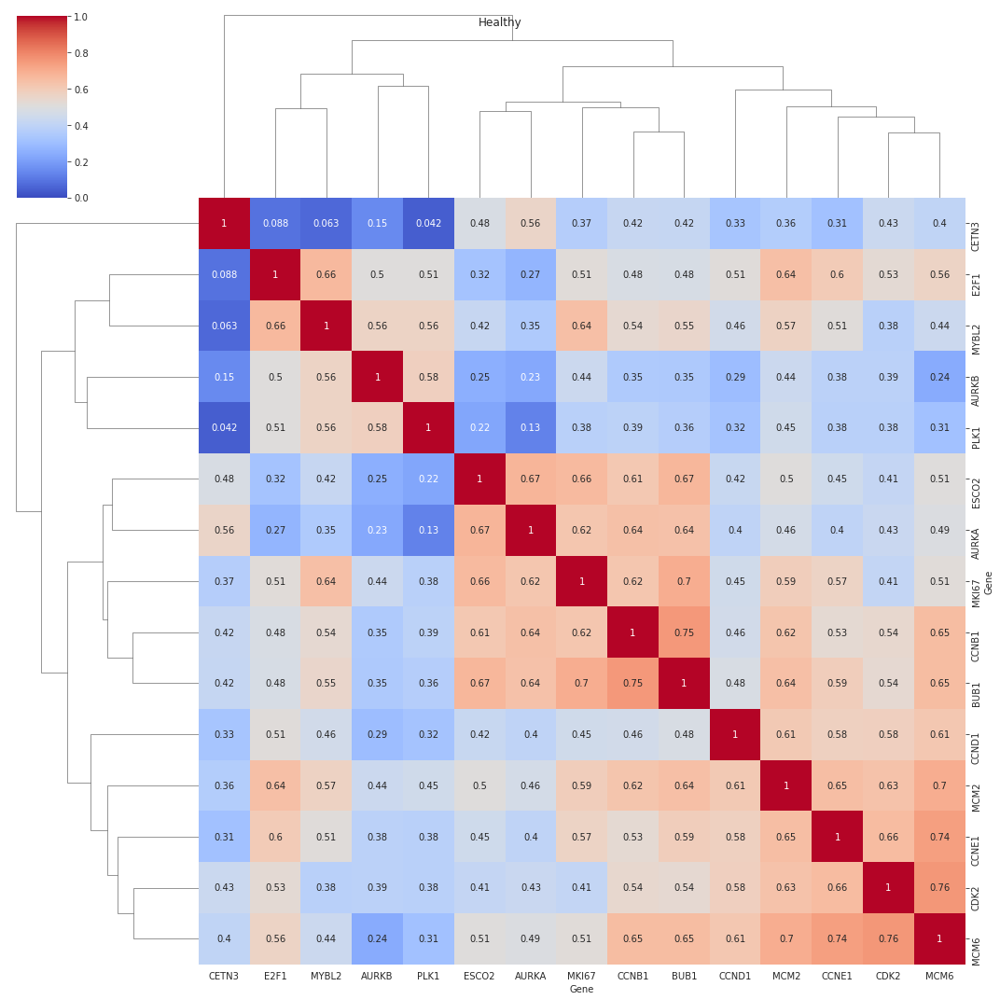

In [127]:
for sign_name, geneset in geneset_of_interest.items():
    print(f'Signature name: {sign_name}')
    df = pd.DataFrame()
    for diag in diagnoses:
        print('Diagnosis(es):', diag)
        if isinstance(diag, list):
            df = pd.concat([blood_expressions[d] for d in diag], axis=1).dropna()
        else:
            df = blood_expressions[diag].dropna()
        df.index.name = 'Gene'
        dft = df.T
        tsne_plot(dft, legend=False, grouping = blood_annot['Dataset'])
        plt.show()
        
        gene_corr_plot(gmt_genes_alt_names(geneset_of_interest, df.T, verbose=False)[signature_name].genes, 
                       df, diag)
        #sns.heatmap(dft.T.corr(method='spearman'), cmap=default_cmap, vmin=0, vmax=1)
        plt.show()
    print('='* 50)

In [128]:
ssgsea_scores = {}
for key, value in blood_expressions.items():
    s = ssgsea_formula(value, gmt_genes_alt_names(geneset_of_interest, value.index, verbose=False)).T
    ssgsea_scores[key] = median_scale(s)

In [137]:
s = pd.concat(ssgsea_scores.values()).clip(-3, 3)
s = s[~s.index.duplicated()]


KeyboardInterrupt



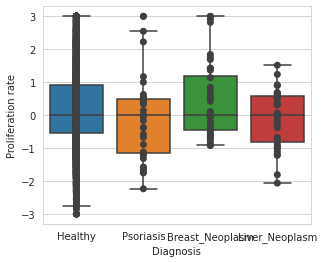

In [140]:
boxplot_with_pvalue(s[signature_name], blood_annot.Diagnosis.reindex(s.index))

# Signature validation: pancan data (TCGA)

### Definition of custom signature (once again, same as above)

In [24]:
#signature_of_interest = '''MKI67	ESCO2	CETN3	CDK2	CCND1	CCNE1	AURKA	AURKB	E2F1	MYBL2	BUB1	PLK1	CCNB1	MCM2	MCM6'''.split('\t')
#OR'IGLL3P', 'IGKC,
signature_of_interest = ['IFNG', 'GZMA', 'GZMB', 'PRF1', 'ZAP70', 'GNLY', 'FASLG', 'TBX21', 'EOMES', 'CD8A', 'GZMH']


#add here a custon signature name (as a first input)
signature_name = 'Effector cells'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

In [25]:
#list all cohorts with expressions available
os.listdir('/uftp/mvp-data/cohorts/')

['Meningioma',
 'NKTCL',
 'Liposarcoma',
 'TCGA-BRCA_Her2',
 'BLCA',
 'AITL',
 'ACC',
 'ALCL',
 'AML',
 'AdCC',
 'CHOL',
 'CLL-polyA',
 'COAD-total',
 'CSCC-polyA',
 'CTCL',
 'DLBCL-polyA',
 'FL-EC-NuGEN',
 'FL-FFPE',
 'FL-polyA',
 'HNSC-total',
 'HNSC_normal',
 'KICH',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUSC',
 'Leiomyosarcoma',
 'MCL',
 'MESO',
 'OV',
 'OV-total',
 'PAAD',
 'PCPG',
 'PRAD',
 'PTCL-NOS',
 'PTCL_LN',
 'PTCL_blood',
 'PUB_BG_Healthy_PBMC',
 'PUB_MM_TCGA_MMRF_NOT_FOR_PRODUCT',
 'PanSolid',
 'Pancreatic_NET',
 'SARC',
 'SARC_P',
 'SKCM',
 'TCGA-Astrocytoma',
 'TCGA-BRCA_Basal',
 'TCGA-BRCA_LumiNorm',
 'TCGA-CESC_AC',
 'TCGA-CESC_SCC',
 'TCGA-COREAD',
 'TCGA-ESGA_AC',
 'TCGA-Glioblastoma',
 'TCGA-HNE_SCC',
 'TCGA-Oligodendroglioma',
 'TGCT',
 'THCA',
 'THYM',
 'THYM_without_TC',
 'UCEC',
 'UCS',
 'UVM',
 'WU_ccRCC_RCCTC',
 'Whole_blood_healthy',
 'custom_normal_ln',
 'Esthesioneuroblastoma']

In [26]:
#list all cohorts with counts available
#os.listdir('/uftp2/Datasets/Xena/TCGA/TCGA_Kallisto_genes_est_counts_without_noncoding/')

In [33]:
# here, we manually select cohorts having both expressions (and counts - in progress, ignore it) available
cohorts = [
 'TCGA-ACC',
 'TCGA-KIRC',
 'TCGA-LIHC',
 'TCGA-BLCA',
 'TCGA-LUAD',
 'TCGA-KICH',
 'TCGA-SARC',
 'TCGA-KIRP',
 'TCGA-LUSC',
 'TCGA-THCA',
 'TCGA-PCPG',
 'TCGA-OV',
 'TCGA-PAAD',
 'TCGA-UVM',
 'TCGA-SKCM',
 'TCGA-UCS',
 'TCGA-UCEC',
 'TCGA-MESO', 
'DLBCL-polyA']

In [38]:
cohorts = os.listdir('/uftp2/Datasets/TCGA/current_version/data/recombined_cohorts/')

In [39]:
tcga_expressions = {}
tcga_ssgsea_ ={}
tcga_ssgsea_unscaled_ = {}
#tcga_counts = {}


for cohort in tqdm(cohorts):
    try:
        e = get_expression_table(cohort, log=True).T
        s = ssgsea_formula(e, gmt_genes_alt_names(geneset_of_interest, e.index, verbose=False)).T
        tcga_expressions[cohort] = e
        tcga_ssgsea_unscaled_[cohort] = s
        tcga_ssgsea_[cohort] = median_scale(s)
    except Exception:
        continue
    
    
    #tcga_counts[cohort] = read_dataset(f'/uftp2/Datasets/Xena/TCGA/TCGA_Kallisto_genes_est_counts_without_noncoding/{cohort}_Kallisto-Xena_genes_est_counts_without_noncoding.tsv.gz')

  0%|          | 0/35 [00:00<?, ?it/s]

In [40]:
tcga_anno = read_dataset('/uftp2/Datasets/TCGA/current_version/data/annotation.tsv')
tcga_expressions = pd.concat(tcga_expressions.values(), axis=1)
tcga_ssgsea = pd.concat(tcga_ssgsea_.values())
tcga_ssgsea_unscaled = pd.concat(tcga_ssgsea_unscaled_.values())
#tcga_counts = pd.concat(tcga_counts.values(), axis=1)

In [ ]:
cmap = plt.cm.tab20
colors = cmap(np.arange(len(tcga_anno['acronym'].value_counts())) % cmap.N)

In [ ]:
plt.figure(figsize=(20, 4))
x = tcga_anno['acronym'].value_counts().sort_values(ascending=False)
plt.bar(range(len(x)), x, color=colors)
plt.xticks(range(len(x)), x.index, rotation=90)
plt.show()

In [41]:
tcga_anno.shape

(11537, 39)

AttributeError: 'set' object has no attribute 'values'

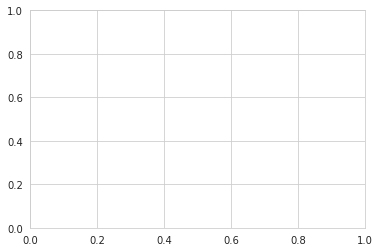

In [42]:
fig1, ax = plt.subplots()

def autopct_more_than_1(pct):
    return ('%1.f%%' % pct) if pct > 4 else ''

p,t,a = ax.pie(x.values, autopct=autopct_more_than_1, colors=colors)
ax.axis('equal') 

# normalize dataframe (not actually needed here, but for general case)
# create handles and labels for legend, take only those where value is > 1
h,l = zip(*[(h,lab) for h,lab,i in zip(p,x.index.values,x.values) if i > 1])

ax.legend(h, l,loc="best", bbox_to_anchor=(1,1))

plt.show()

Temporary solution: now we have multiple models for deconvolution (see list of all available models below). 
You can pick any model suitable for you.

In [114]:
# list of all available models:
available_models = os.listdir('/uftp/Deconvolution/product/new_models/')
available_models = [i for i in available_models if 'v1' in i]
available_models

['blood_thx_v1',
 'blood_cd4mem_v1',
 'glioblastoma_v1',
 'lymph_node_v1',
 'default_solid_v1']

In [115]:
# calculate deconvolution using model of interest

# pick any model you find suitable from the output of previous cell - default_solid in example
deconv_model_of_interest =  'default_solid_v1'

from mldeconv.models.tumor_model import TumorModel

model = TumorModel.load(f'/uftp/Deconvolution/product/new_models/{deconv_model_of_interest}/')
tcga_deconv = model.predict(2**(tcga_expressions)-1)

Expressions OK


In [116]:
tcga_deconv

,TCGA-KK-A7B0-01,TCGA-YL-A8SJ-01,TCGA-EJ-7791-01,TCGA-HC-A6AP-01,TCGA-EJ-8472-01,TCGA-J4-A67N-01,TCGA-EJ-7785-01,TCGA-EJ-7782-01,TCGA-YL-A9WK-01,TCGA-KK-A8IL-01,...,DO52677,DO27763,DO52693,DO27825,DO52676,DO27855,DO52683,DO221120,DO27813,DO27781
Other,0.463077,0.662796,0.471029,0.603750,0.792313,0.784655,0.492280,0.678537,0.635885,0.583276,...,0.045909,0.113257,0.028086,0.138649,0.010363,0.090329,0.141838,0.015154,0.018836,0.033743
Basophils,0.016652,0.022629,0.020093,0.026526,0.006017,0.023273,0.043011,0.035856,0.024549,0.036794,...,0.011036,0.007326,0.008750,0.004643,0.014401,0.008190,0.042305,0.009053,0.009300,0.015126
CD8_T_cells_PD1_high,0.016909,0.000808,0.011618,0.004505,0.002243,0.004510,0.027133,0.003727,0.010827,0.025976,...,0.051991,0.004423,0.033304,0.019052,0.119029,0.107767,0.014909,0.111864,0.189900,0.035101
CD8_T_cells_PD1_low,0.057385,0.001691,0.030372,0.008732,0.007554,0.014434,0.038010,0.011311,0.037844,0.062580,...,0.000000,0.002920,0.002389,0.006823,0.020625,0.010649,0.002349,0.007605,0.014294,0.000441
CDC,0.013301,0.006916,0.018518,0.018316,0.007319,0.013278,0.024822,0.019063,0.017908,0.017275,...,0.008511,0.003218,0.007002,0.002860,0.007998,0.023047,0.002736,0.011151,0.017653,0.003450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CD4_T_cells,0.142074,0.003697,0.056001,0.039396,0.002057,0.010320,0.042861,0.022371,0.027208,0.045876,...,0.191264,0.010307,0.200941,0.016776,0.367871,0.020162,0.023911,0.303624,0.232066,0.197176
B_cells,0.134045,0.004432,0.101207,0.050739,0.014587,0.010334,0.075051,0.026639,0.012190,0.038720,...,0.634058,0.826369,0.663668,0.762362,0.413615,0.659968,0.711364,0.465396,0.392098,0.669437
T_cells,0.216368,0.006197,0.097991,0.052632,0.011854,0.029264,0.108005,0.037409,0.075879,0.134432,...,0.243255,0.017650,0.236633,0.042651,0.507525,0.138578,0.041169,0.423093,0.436260,0.232717
Myeloid_cells,0.060777,0.062705,0.061582,0.086080,0.038078,0.070587,0.109536,0.086264,0.080343,0.109417,...,0.038537,0.026012,0.041432,0.024112,0.038413,0.069859,0.087169,0.054623,0.103749,0.042165


### Check if all genes in signatures are expressed (in progress!)

In [17]:
#from bioreactor.exp_noize import *

Below, we have an implementation of Noise model (developed by Ilia Cheremushkin)
WE HAVE PUBLICATION OMG

In [117]:
GENE_LENGTH = '/uftp/Deconvolution/training/config/gene_length_values.tsv'
ALPHA = 2.05 * 1000
gene_length = pd.read_csv(GENE_LENGTH, sep='\t', index_col=0)

def calculate_sample_noise(
    sample: pd.Series,
    readcounts: float,
    gene_length: pd.DataFrame = gene_length) -> pd.Series:
    noise = ALPHA * np.sqrt(sample.divide(gene_length.loc[sample.index, 'length'], axis='index') / readcounts)
    return noise.clip(lower=0)

In [30]:
#tcga_expressions_for_noise, tcga_counts_for_noise = to_common_samples([tcga_expressions.T, tcga_counts.T])

In [31]:
#noise_percent = calculate_sample_noise(np.exp(tcga_expressions_for_noise) - 1, tcga_counts_for_noise.sum(axis=1))

In [118]:
'''noise_percent = tcga_expressions_for_noise.apply(lambda x: 100*calculate_sample_noise(x, tcga_counts_for_noise.loc[x.name])/x, 
                                axis=1)'''

'noise_percent = tcga_expressions_for_noise.apply(lambda x: 100*calculate_sample_noise(x, tcga_counts_for_noise.loc[x.name])/x, \n                                axis=1)'

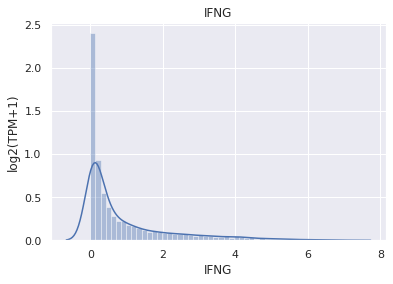

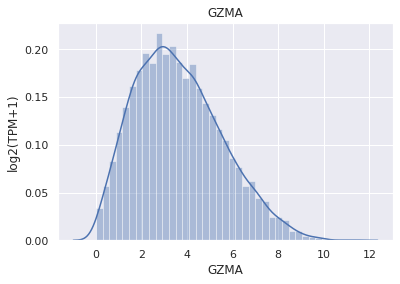

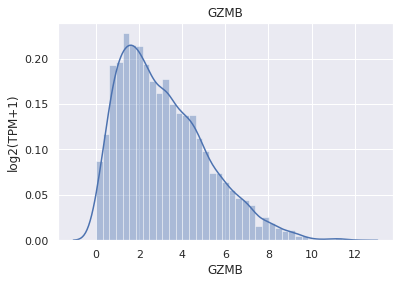

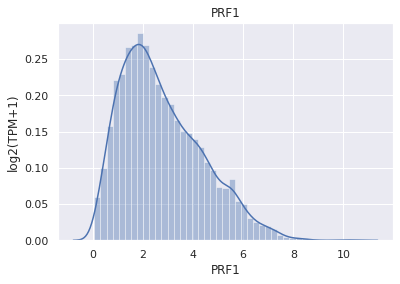

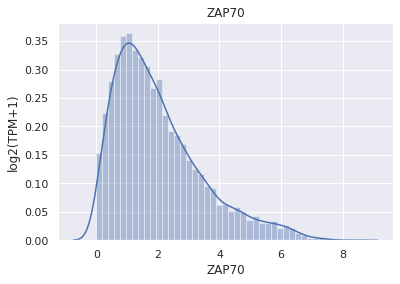

...

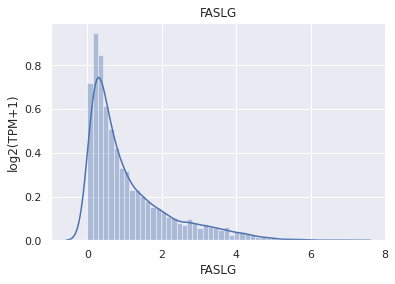

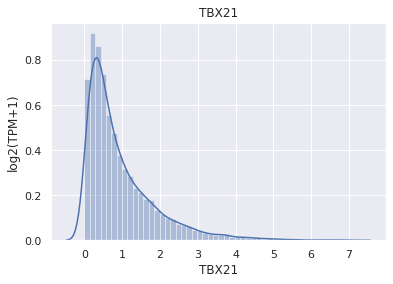

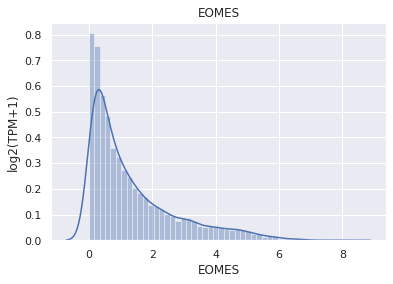

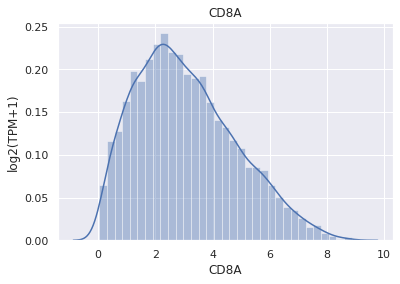

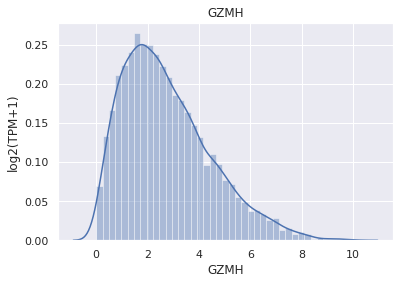

In [119]:
for gene in signature_of_interest:
    sns.distplot(tcga_expressions.loc[gene])
    plt.ylabel('log2(TPM+1)')
    plt.title(gene)
    plt.show()

In [43]:
df = tcga_expressions.loc[signature_of_interest]

In [49]:
plt.rcParams['svg.fonttype'] = 'none'

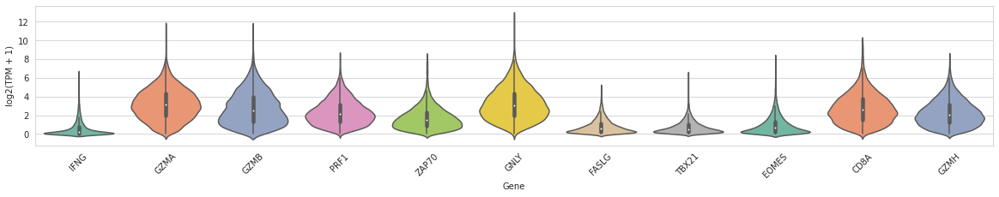

In [50]:
df = tcga_expressions.loc[signature_of_interest]
data = pd.melt(df.T)
data['KDE'] = 'Gene'

plt.figure(figsize = (20, 3))
sns.violinplot(
    x='Gene',
    y='value',
    data=pd.concat([data]),
    palette="Set2",
    split=True,
    scale="count",
    inner='box')

plt.ylabel('log2(TPM + 1)')
plt.xticks(rotation=45)
plt.savefig('/home/eocheredko/Effector_cells_expressions_pancan_signature.svg', bbox_inches='tight')
plt.show()

In [122]:
'''for gene in signature_of_interest:
    sns.distplot(tcga_expressions_for_noise.T.loc[gene])
    plt.xlabel(f'{gene} log2 TPM')
    plt.show()
    
    sns.distplot(noise_percent.T.loc[gene])
    plt.xlabel(f'{gene} noise (std)')
    plt.show()'''

"for gene in signature_of_interest:\n    sns.distplot(tcga_expressions_for_noise.T.loc[gene])\n    plt.xlabel(f'{gene} log2 TPM')\n    plt.show()\n    \n    sns.distplot(noise_percent.T.loc[gene])\n    plt.xlabel(f'{gene} noise (std)')\n    plt.show()"

In [123]:
# bad genes example
'''for gene in ['PRAME', 'MAGEA1', 'SSX2', 'CT83']:
    plt.scatter(np.exp(tcga_expressions_for_noise.T.loc[gene]) - 1, 
                noise_percent.T.loc[gene])
    plt.title(gene)
    plt.show()'''

"for gene in ['PRAME', 'MAGEA1', 'SSX2', 'CT83']:\n    plt.scatter(np.exp(tcga_expressions_for_noise.T.loc[gene]) - 1, \n                noise_percent.T.loc[gene])\n    plt.title(gene)\n    plt.show()"

### Check if there are anticorrelating genes

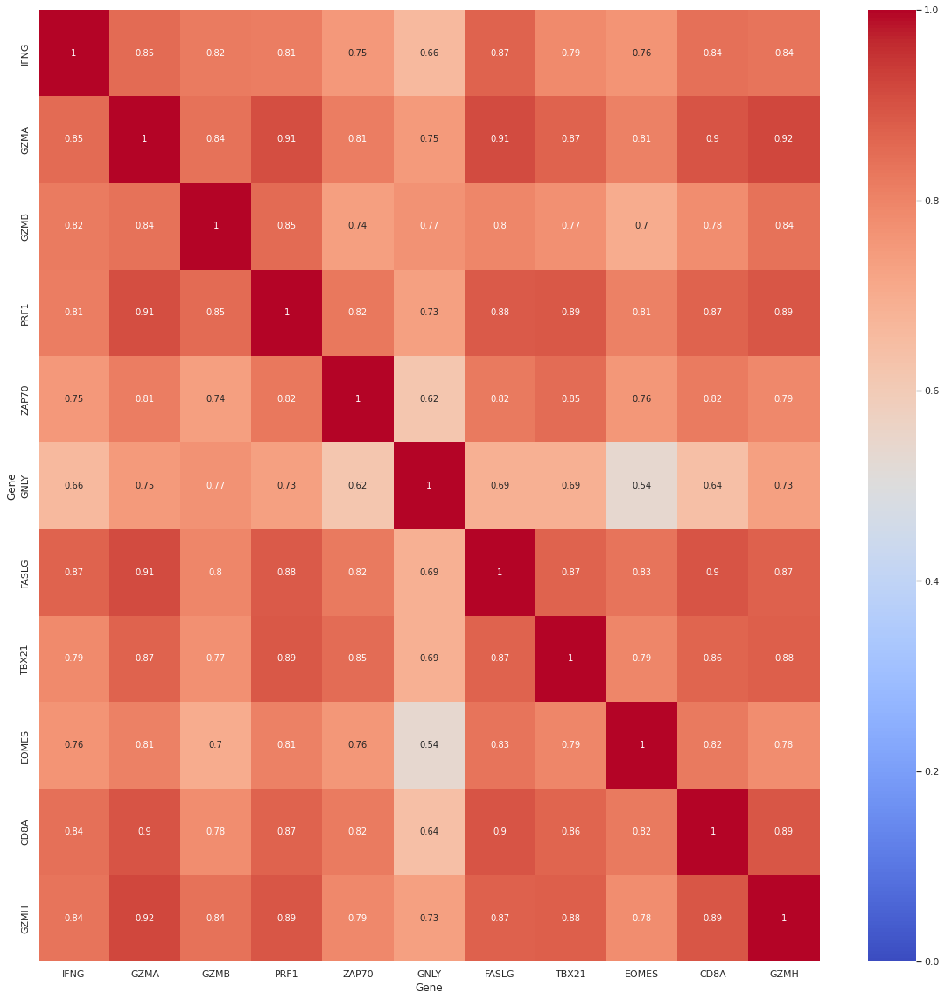

In [124]:
plt.figure(figsize=(20, 20))
sns.heatmap(tcga_expressions.T[signature_of_interest].corr(method='spearman'), cmap=default_cmap, annot=True, 
        annot_kws={"fontsize":10},
           vmin=0, vmax=1)
plt.show()

### Check if this signature overlaps/correlates with existing signatures from Chess DB

#### Load signatures from CHESS DB using GefestDAL

In [125]:
from gefest.requesters import AthenaRequester, AvicennaRequester, PandoraRequesterV2, GeneStorageRequester, \
                              JormungandrRequester, BiomarkerStorageRequesterV2, GefestDALRequester

from pathlib import posixpath                              
DUMP_PATH_BASE = '/uftp/shared/Hephaestus_sources/'


# BiomStorage
biomarkers_storage_dump_dict = {
    'bat_data': posixpath.join(DUMP_PATH_BASE, 'BiomarkerAnnotations', 'BiomarkerAnnotations.json'),
    'superbiomarkers': posixpath.join(DUMP_PATH_BASE, 'Superbiomarkers', 'Superbiomarkers.json')
}


# Avicenna
avicenna_dump_dict = {
    'avicennaTherapyIndications': posixpath.join(DUMP_PATH_BASE, 'TherapyIndications', 'TherapyIndications.json'),
    'main_data': posixpath.join(DUMP_PATH_BASE, 'Avicenna', 'Avicenna.json'),
    'avicennaTIRegimens': posixpath.join(DUMP_PATH_BASE, 'TIRegimens', 'TIRegimens.json'),
}

AVICENNA = AvicennaRequester.from_dump(dump_dict=avicenna_dump_dict)

# Pandora
PANDORA = PandoraRequesterV2.from_dump(dump_path='/uftp/shared/Hephaestus_sources/Pandora/Pandora.json')

# GefestDAL
gefest_dal_dump_dict = {
    'chess': posixpath.join(DUMP_PATH_BASE, 'Chess', 'Chess.json'),
    'mfp_portrait': posixpath.join(DUMP_PATH_BASE, 'PortraitDescription', 'PortraitDescription.json'),
    'triple_typing_mutation_status': posixpath.join(DUMP_PATH_BASE, 'TripleTypingMutationStatus',
                                                    'TripleTypingMutationStatus.json'),
    'deconv_config': posixpath.join(DUMP_PATH_BASE, 'DeconvolutionConfigs', 'DeconvolutionConfigs.json')
}
GEFEST = GefestDALRequester.from_dump(dump_dict=gefest_dal_dump_dict, pandora=PANDORA)

# Athena
ATHENA = AthenaRequester(dump_path='/uftp/shared/Hephaestus_sources/Athena/Athena.json')

# Jorm
JORMUNGANDR = JormungandrRequester()

In [126]:
gmt_solid = GEFEST.load_gmt('Solid_Neoplasm')
gmt_blood = GEFEST.load_gmt('Hematologic_Neoplasm')

In [127]:
gmt_solid = {key:value for key, value in gmt_solid.items() if 'Main4' in key}
gmt_blood = {key:value for key, value in gmt_blood.items() if 'Main4' in key}

### OR

#### Load signatures from CHESS DB, uftp data

In [114]:
gmt_solid = read_dataset('/uftp/shared/signature_database/solid_gmt/current/gmt_solid_2022-03-22.10:24.gmt')

In [115]:
gmt_solid = {j.name:GeneSet(j.name, '', set(j.dropna().values)) for i, j in gmt_solid.iterrows()}

#### Correlations

In [128]:
print('Checking for overlaps with Solid Neoplasm signatures...')
for sig_name, sig in gmt_solid.items():
    if len(sig.genes) > 0:
        common_genes = set(signature_of_interest).intersection(set(sig.genes))
        if len(common_genes)/len(signature_of_interest) > .75 or len(common_genes)/len(sig.genes) > .75:
            print(f'Your signature looks alike to {sig_name}:')
            
print('Checking for overlaps with Blood signatures...')
for sig_name, sig in gmt_blood.items():
    if len(sig.genes) > 0:
        common_genes = set(signature_of_interest).intersection(set(sig.genes))
        if len(common_genes)/len(signature_of_interest) > .75 or len(common_genes)/len(sig.genes) > .75:
            print(f'Your signature looks alike to {sig_name}:')
            
print('Done')

Checking for overlaps with Solid Neoplasm signatures...
Your signature looks alike to Main4_Effector_cells:
Checking for overlaps with Blood signatures...
Your signature looks alike to Main4_Effector_cells_Blood:
Done


In [129]:
print('Checking for correlation with Solid Neoplasm signatures...')
solid_pancan = ssgsea_formula(tcga_expressions, gmt_genes_alt_names(gmt_solid, tcga_expressions.index, 
                                                                    verbose=False)).T
solid_pancan.corrwith(tcga_ssgsea_unscaled[signature_name]).sort_values().dropna().tail(20)

Checking for correlation with Solid Neoplasm signatures...


Main4_Suppressive_cytokines_SOLID    0.727438
Main4_Macrophage_DC_traffic          0.738381
Main4_B_cells                        0.747288
Main4_Treg                           0.748216
Main4_Metastasis_promotion_SOLID     0.794432
                                       ...   
Main4_Checkpoint_inhibition          0.931326
Main4_Th1_signature                  0.934133
Main4_NK_cells                       0.977779
Main4_CD8_T_cells                    0.985978
Main4_Effector_cells                 1.000000
Length: 20, dtype: float64

In [130]:
print('Checking for correlation with Blood signatures...')
solid_pancan = ssgsea_formula(tcga_expressions, gmt_genes_alt_names(gmt_blood, tcga_expressions.index, 
                                                                    verbose=False)).T
solid_pancan.corrwith(tcga_ssgsea_unscaled[signature_name]).sort_values().dropna().tail(20)

Checking for correlation with Blood signatures...


Main4_T_reg_traffic_Blood            0.607314
Main4_MHCII_Blood                    0.665692
Main4_IFN_JAK_STAT_signaling         0.669437
Main4_MHCI_Blood                     0.671599
Main4_M2_signature_Blood             0.673990
                                       ...   
Main4_T_cells_Blood                  0.925103
Main4_Checkpoint_inhibition_Blood    0.932837
Main4_NK_cells_Blood                 0.977779
Main4_CD8_T_cells_Blood              0.986004
Main4_Effector_cells_Blood           0.995605
Length: 20, dtype: float64

### Is this signature robust? (in progress!!!)

In [ ]:
from scipy.stats import mannwhitneyu

In [ ]:
signature_of_interest_clipping = signature_of_interest

In [ ]:
gene_to_exclude = 'KIR2DL4'

In [ ]:
geneset_of_interest_clipped = {'GeneSet':GeneSet('Geneset', '', list(set(signature_of_interest_clipping).difference(set([gene_to_exclude]))))}

In [ ]:
tcga_after_gene_exclusion = {'all_genes': tcga_ssgsea_unscaled}
df = tcga_expressions.T[signature_of_interest].corr(method='spearman')
is_signature_robust=True
signature_of_interest_clipping = signature_of_interest

while is_signature_robust:
    gene_to_exclude = df.max().idxmax()
    print(gene_to_exclude)
    tcga_ssgsea_clipped = {}
    geneset_of_interest_clipped = {'GeneSet':GeneSet('Geneset', '', list(set(signature_of_interest_clipping).difference(set([gene_to_exclude]))))}
    
    for cohort in tqdm(cohorts):
        e = get_expression_table(cohort, log=True).T
        s = ssgsea_formula(e, gmt_genes_alt_names(geneset_of_interest_clipped, e.index, verbose=False)).T
        tcga_ssgsea_clipped[cohort] = s
     
    signature_of_interest_clipping = geneset_of_interest_clipped['GeneSet'].genes
    genes_excluded = ', '.join(set(geneset_of_interest['GeneSet'].genes).difference(set(signature_of_interest_clipping)))
    tcga_after_gene_exclusion[genes_excluded] = pd.concat(tcga_ssgsea_clipped.values())

    stat, p = mannwhitneyu(tcga_after_gene_exclusion['all_genes'], tcga_after_gene_exclusion[genes_excluded])
    df = tcga_expressions.T[signature_of_interest_clipping].corr(method='spearman')
    if p < 0.0:
        print(f'After removal of genes {genes_excluded} signature significantly changes')
        is_signature_robust=False

In [ ]:
tcga_after_gene_exclusion.keys()

In [ ]:
plt.subplots()
for key, value in tcga_after_gene_exclusion.items():
    sns.distplot(tcga_after_gene_exclusion['all_genes'], label = 'all')
    sns.distplot(tcga_after_gene_exclusion['NKG7'], label = 'NKG7')
#plt.legend()
plt.show()

### Survival

In [ ]:
survival = prepare_survival_annotation(tcga_anno.OS, tcga_anno.OS_FLAG)

In [ ]:
for diagnosis in tcga_anno.acronym.unique():
    print(diagnosis)
    kaplan_meier_quantiles(tcga_ssgsea['GeneSet'].reindex(tcga_anno[tcga_anno.acronym==diagnosis].index), survival)
    plt.show()

### Correlation with any celltype from deconvolution

In [131]:
#list all available celltypes from deconvolution
tcga_deconv.index.tolist()

['Other',
 'Basophils',
 'CD8_T_cells_PD1_high',
 'CD8_T_cells_PD1_low',
 'CDC',
 'Class_switched_memory_B_cells',
 'Classical_monocytes',
 'Cytotoxic_NK_cells',
 'Endothelium',
 'Eosinophils',
 'Fibroblasts',
 'Macrophages_M1',
 'Macrophages_M2',
 'Naive_B_cells',
 'Naive_T_helpers',
 'Neutrophils',
 'Non_classical_monocytes',
 'Non_switched_memory_B_cells',
 'PDC',
 'Plasmablasts',
 'Regulatory_NK_cells',
 'Th17_cells',
 'Th1_cells',
 'Th2_cells',
 'Tregs',
 'NK_cells',
 'Monocytes',
 'Mature_B_cells',
 'Macrophages',
 'Granulocytes',
 'CD8_T_cells',
 'CD4_T_cells',
 'B_cells',
 'T_cells',
 'Myeloid_cells',
 'Lymphoid_cells']

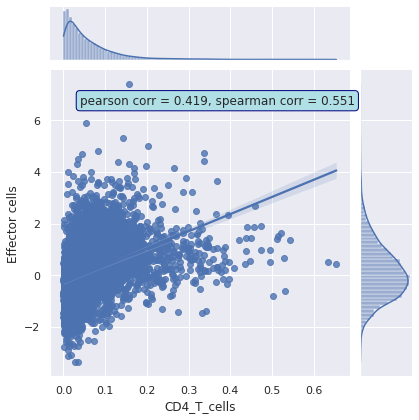

In [132]:
celltype_from_deconv = 'CD4_T_cells'

g = sns.jointplot(tcga_deconv.loc[celltype_from_deconv], tcga_ssgsea[signature_name], kind='reg')
r, p = scipy.stats.pearsonr(tcga_deconv.loc[celltype_from_deconv], tcga_ssgsea[signature_name])
rs, ps = scipy.stats.spearmanr(tcga_deconv.loc[celltype_from_deconv], tcga_ssgsea[signature_name])
    
g.ax_joint.annotate(f'pearson corr = {r:.3f}, spearman corr = {rs:.3f}',
                xy=(0.1, 0.9), xycoords='axes fraction',
                ha='left', va='center',
                bbox={'boxstyle': 'round', 'fc': 'powderblue', 'ec': 'navy'})

plt.show()

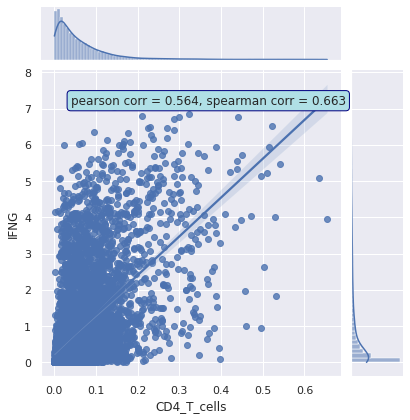

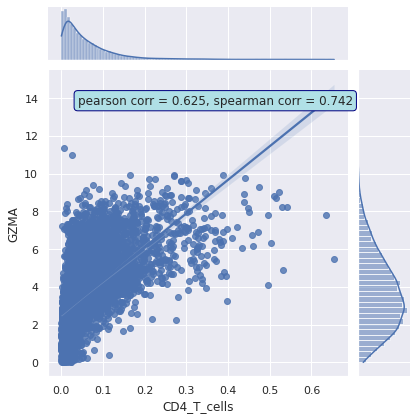

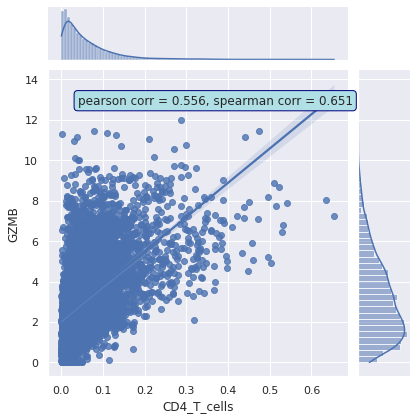

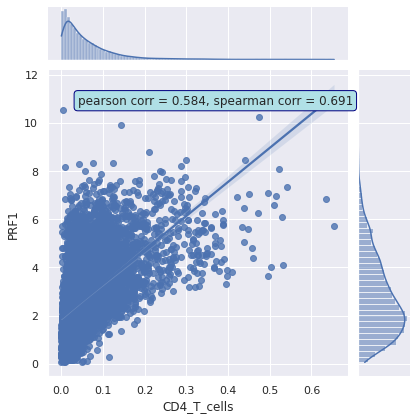

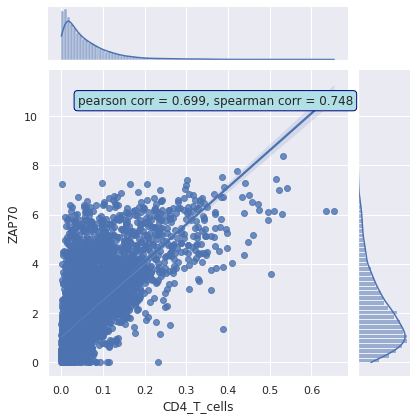

...

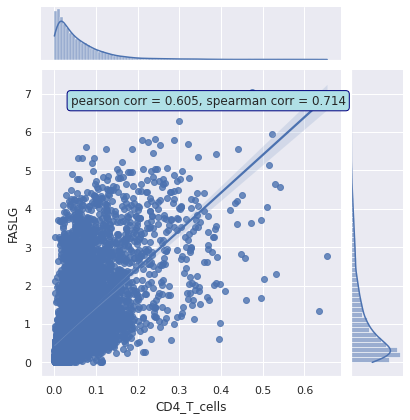

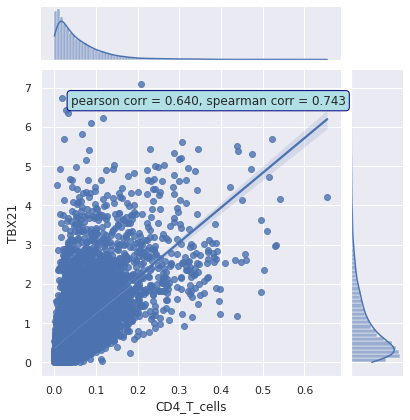

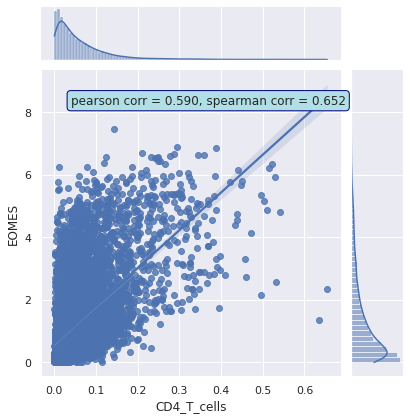

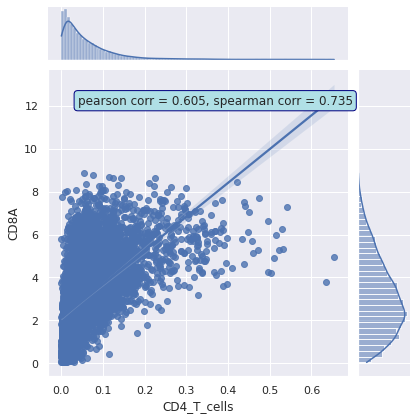

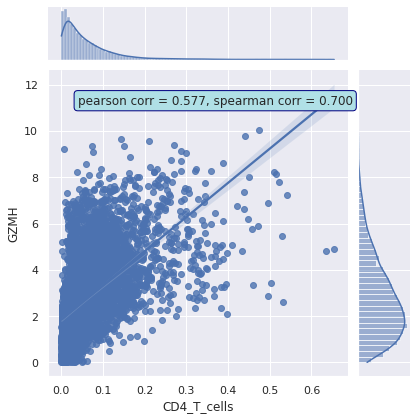

In [133]:
# comparison with deconvolution for every gene (log2 (TPM+1)) in your signature of interest
for gene in signature_of_interest:
    g = sns.jointplot(tcga_deconv.loc[celltype_from_deconv], tcga_expressions.loc[gene], kind='reg')
    
    r, p = scipy.stats.pearsonr(tcga_deconv.loc[celltype_from_deconv], tcga_expressions.loc[gene])
    rs, ps = scipy.stats.spearmanr(tcga_deconv.loc[celltype_from_deconv], tcga_expressions.loc[gene])
    
    g.ax_joint.annotate(f'pearson corr = {r:.3f}, spearman corr = {rs:.3f}',
                    xy=(0.1, 0.9), xycoords='axes fraction',
                    ha='left', va='center',
                    bbox={'boxstyle': 'round', 'fc': 'powderblue', 'ec': 'navy'})
    plt.show()

In [134]:
deconv_corr_by_diagnosis = pd.DataFrame(columns = tcga_ssgsea_.keys(), index=tcga_deconv.index)
for key, value in tcga_ssgsea_.items():
    for celltype in tcga_deconv.index:
        deconv_corr_by_diagnosis.at[celltype, key] = scipy.stats.spearmanr(value[signature_name], 
                                                                    tcga_deconv[value.index].loc[celltype]).correlation
        

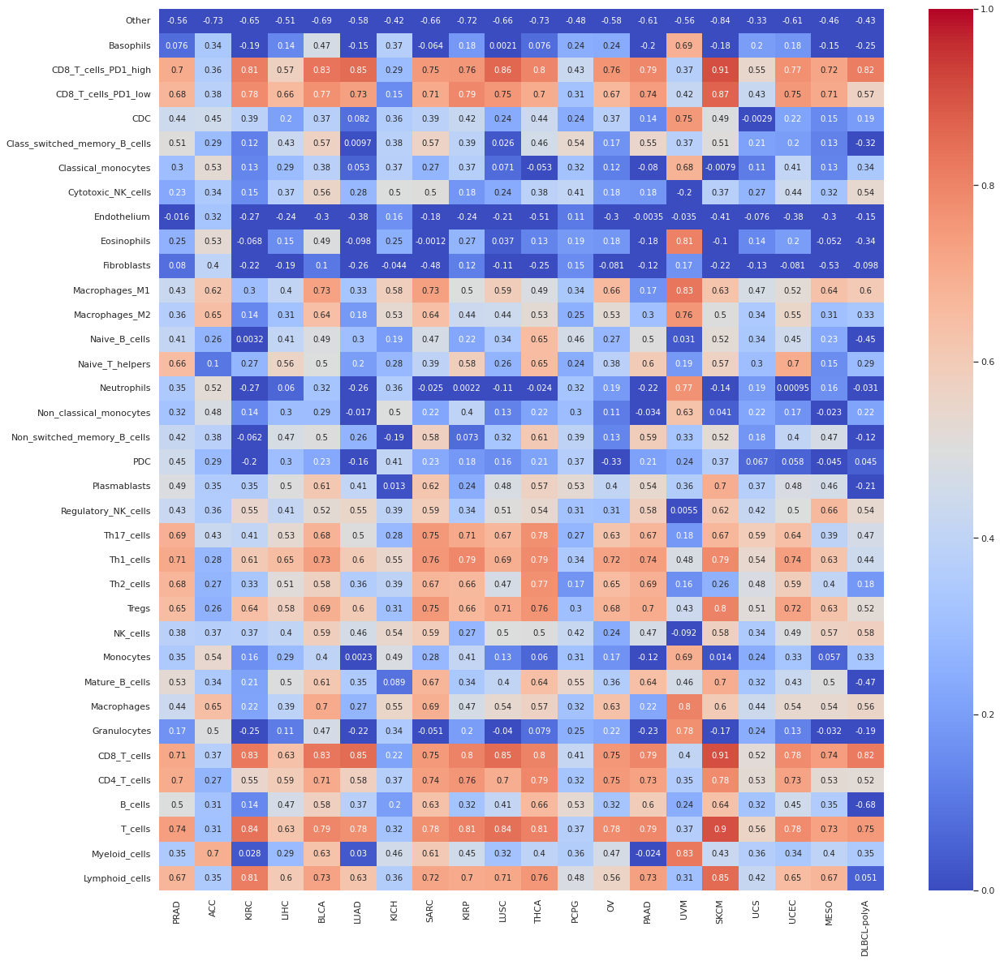

In [135]:
plt.figure(figsize=(20, 20))
sns.heatmap(deconv_corr_by_diagnosis.astype(float), cmap=default_cmap, annot=True, 
        annot_kws={"fontsize":10},
           vmin=0, vmax=1)
plt.show()

# Signature validation: single cell data

In [136]:
import scanpy as sc

### Definition of custom signature (once again, same as above)

In [137]:
#signature_of_interest = '''IGLL3P	IGKC	IGHM	GUSBP11	IGHD	MZB1	JCHAIN	CD38	POU2AF1	TNFRSF17	CD27	SIK1	EAF2	HLA-DOB	MAN1A1'''.split('\t')
#OR
signature_of_interest = ['IFNG', 'GZMA', 'GZMB', 'PRF1', 'ZAP70', 'GNLY', 'FASLG', 'TBX21', 'EOMES', 'CD8A', 'GZMH']

#add here a custon signature name (as a first input)
signature_name = 'Effector cells'
geneset_of_interest = {signature_name:GeneSet(signature_name, '', signature_of_interest)}

### read annotation and expressions

https://docs.google.com/spreadsheets/d/1OPG6o5rq8lOnP1QZm8gSmgLPjq3Vz-gM6o3i8wzkBbQ/edit#gid=0 - here we have a full list of single cell data, pick anything suitable for your signature. Replace path in cell below with the path you see in H5ad column

In [138]:
adata = sc.read('/uftp/single_cell/annotations/BostonGene_data/210223_NovaB_RNA_10X/RS0154_s3_NSCLC/query_RS0154_s3_NSCLC.h5ad')

In [139]:
# check which column describes celltype in your  adata and pick this columns for the next cell in notebook
adata.obs

,nCount_RNA,nFeature_RNA,pct_counts_Mito,doublet_scores,RNA_snn_res.2,seurat_clusters,predicted.celltype.l2,annot,S_score,G2M_score,phase
AAACCCAAGCCAACCC-1,2360.0,1174,7.838983,0.057143,9,9,NK,NK,-0.107550,-0.080928,G1
AAACCCACACTGCGAC-1,1238.0,53,7.189015,0.002896,15,15,Eryth,Ery,-0.011299,0.028253,G2M
AAACCCACATCGTTCC-1,1228.0,643,29.397394,0.024414,1,1,CD4 TEM,CD4_T,-0.037383,-0.081984,G1
AAACCCAGTAGTCTGT-1,575.0,377,13.043478,0.047323,28,28,Platelet,Fibroblasts,-0.024492,-0.097022,G1
AAACCCAGTGAGTTTC-1,1832.0,58,0.000000,0.002896,15,15,Eryth,Ery,-0.006765,-0.006869,G1
...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTACAGAGC-1,4690.0,1545,11.044776,0.059889,5,5,B intermediate,B_cells,-0.132283,-0.060114,G1
TTTGTTGGTCATCGGC-1,11853.0,2933,8.149835,0.065789,0,0,B intermediate,B_cells,-0.071490,-0.065449,G1
TTTGTTGGTCCAATCA-1,7621.0,2595,13.659625,0.096715,25,25,CD8 Proliferating,T_Proliferating,0.257822,0.003950,S
TTTGTTGGTCCTACGG-1,7794.0,2567,12.022068,0.037162,4,4,B intermediate,B_cells,0.036068,0.108677,G2M


In [140]:
celltype_col = 'predicted.celltype.l2'

In [141]:
#logn TPM+1
adata.X = scipy.sparse.csc_matrix(adata.X)
expr_df = pd.DataFrame.sparse.from_spmatrix(adata.X, index=adata.obs_names, columns=adata.var_names).T
expr_df

,AAACCCAAGCCAACCC-1,AAACCCACACTGCGAC-1,AAACCCACATCGTTCC-1,AAACCCAGTAGTCTGT-1,AAACCCAGTGAGTTTC-1,AAACCCAGTGCATGTT-1,AAACCCATCAGCAATC-1,AAACCCATCATCCCGT-1,AAACCCATCCCAAGCG-1,AAACCCATCTCTCTTC-1,...,TTTGTTGAGTGGCGAT-1,TTTGTTGAGTTATGGA-1,TTTGTTGAGTTCTCTT-1,TTTGTTGCAACGTTAC-1,TTTGTTGCATAGCACT-1,TTTGTTGGTACAGAGC-1,TTTGTTGGTCATCGGC-1,TTTGTTGGTCCAATCA-1,TTTGTTGGTCCTACGG-1,TTTGTTGTCGAGCACC-1
OR4F5,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
FO538757.3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
FO538757.2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.315181,0.0,0.000000,0.199746,...,0.000000,0.000000,0.000000,1.510409,0.000000,0.000000,0.000000,0.000000,0.000000,1.792176
OR4F29,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
OR4F16,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND4L,0.000000,2.842295,2.849934,0.000000,0.0,1.869215,1.048209,0.0,1.554651,1.354339,...,1.910096,1.914028,0.000000,1.510409,0.000000,1.660966,1.802041,1.832366,0.000000,0.000000
MT-ND4,4.631763,4.498175,5.535139,5.345657,0.0,4.655682,3.939425,0.0,4.821919,4.541790,...,4.469420,5.519679,4.601629,4.166890,4.746723,4.859283,4.659799,4.864391,4.640953,3.714060
MT-ND5,3.099481,0.000000,4.307975,0.000000,0.0,2.482104,2.582241,0.0,2.768438,2.610236,...,0.000000,3.490182,2.962839,3.591427,3.260771,3.196800,3.015749,3.480992,2.872406,2.398350
MT-ND6,1.655804,2.205804,0.000000,0.000000,0.0,0.863228,1.048209,0.0,1.053167,0.508789,...,0.000000,0.000000,0.000000,0.000000,1.331182,0.000000,0.611757,0.000000,0.825507,0.000000


### delete genes w zero counts

In [142]:
row_sums = expr_df.sum(axis=1)
row_sums

OR4F5             0.000000
FO538757.3        1.048209
FO538757.2     1524.839233
OR4F29            0.000000
OR4F16            0.000000
                  ...     
MT-ND4L       11634.238281
MT-ND4        46065.351562
MT-ND5        28269.183594
MT-ND6         6760.913086
MT-CYB        46983.703125
Length: 20208, dtype: float32

In [143]:
row_sums = row_sums[row_sums > 0]
row_sums

FO538757.3        1.048209
FO538757.2     1524.839233
SAMD11          108.592384
NOC2L          1617.307739
KLHL17          174.174591
                  ...     
MT-ND4L       11634.238281
MT-ND4        46065.351562
MT-ND5        28269.183594
MT-ND6         6760.913086
MT-CYB        46983.703125
Length: 17768, dtype: float32

In [144]:
#If the matrix is too big (> 20k cells) it can be better to replace expr_df instead of creating a copy
expr_df_final = expr_df.loc[row_sums.index]
expr_df_final

,AAACCCAAGCCAACCC-1,AAACCCACACTGCGAC-1,AAACCCACATCGTTCC-1,AAACCCAGTAGTCTGT-1,AAACCCAGTGAGTTTC-1,AAACCCAGTGCATGTT-1,AAACCCATCAGCAATC-1,AAACCCATCATCCCGT-1,AAACCCATCCCAAGCG-1,AAACCCATCTCTCTTC-1,...,TTTGTTGAGTGGCGAT-1,TTTGTTGAGTTATGGA-1,TTTGTTGAGTTCTCTT-1,TTTGTTGCAACGTTAC-1,TTTGTTGCATAGCACT-1,TTTGTTGGTACAGAGC-1,TTTGTTGGTCATCGGC-1,TTTGTTGGTCCAATCA-1,TTTGTTGGTCCTACGG-1,TTTGTTGTCGAGCACC-1
FO538757.3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
FO538757.2,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.315181,0.0,0.000000,0.199746,...,0.000000,0.000000,0.000000,1.510409,0.000000,0.000000,0.000000,0.000000,0.000000,1.792176
SAMD11,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
NOC2L,1.655804,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,1.358454,0.000000,0.000000,1.331182,0.000000,0.000000,0.000000,0.000000,0.000000
KLHL17,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.611757,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND4L,0.000000,2.842295,2.849934,0.000000,0.0,1.869215,1.048209,0.0,1.554651,1.354339,...,1.910096,1.914028,0.000000,1.510409,0.000000,1.660966,1.802041,1.832366,0.000000,0.000000
MT-ND4,4.631763,4.498175,5.535139,5.345657,0.0,4.655682,3.939425,0.0,4.821919,4.541790,...,4.469420,5.519679,4.601629,4.166890,4.746723,4.859283,4.659799,4.864391,4.640953,3.714060
MT-ND5,3.099481,0.000000,4.307975,0.000000,0.0,2.482104,2.582241,0.0,2.768438,2.610236,...,0.000000,3.490182,2.962839,3.591427,3.260771,3.196800,3.015749,3.480992,2.872406,2.398350
MT-ND6,1.655804,2.205804,0.000000,0.000000,0.0,0.863228,1.048209,0.0,1.053167,0.508789,...,0.000000,0.000000,0.000000,0.000000,1.331182,0.000000,0.611757,0.000000,0.825507,0.000000


### ssgsea

In [145]:
cgenes = expr_df_final
#cgenes = cgenes.fillna(cgenes.median(axis=1))

cprocesses = ssgsea_formula(cgenes, gmt_genes_alt_names(geneset_of_interest, cgenes.index, verbose=False), rank_method='average').T
cprocesses_sc = median_scale(cprocesses)
#if we don't want to scale ssgsea scores:
#cprocesses_sc = cprocesses

In [146]:
cprocesses_sc["Cell_types"] = adata.obs[celltype_col].tolist()
cprocesses_sc["Cell_name"] = cprocesses_sc.index
cprocesses_sc

,Effector cells,Cell_types,Cell_name
AAACCCAAGCCAACCC-1,6.446350,NK,AAACCCAAGCCAACCC-1
AAACCCACACTGCGAC-1,0.499733,Eryth,AAACCCACACTGCGAC-1
AAACCCACATCGTTCC-1,0.146628,CD4 TEM,AAACCCACATCGTTCC-1
AAACCCAGTAGTCTGT-1,0.305825,Platelet,AAACCCAGTAGTCTGT-1
AAACCCAGTGAGTTTC-1,0.496740,Eryth,AAACCCAGTGAGTTTC-1
...,...,...,...
TTTGTTGGTACAGAGC-1,-0.393203,B intermediate,TTTGTTGGTACAGAGC-1
TTTGTTGGTCATCGGC-1,0.018876,B intermediate,TTTGTTGGTCATCGGC-1
TTTGTTGGTCCAATCA-1,6.131900,CD8 Proliferating,TTTGTTGGTCCAATCA-1
TTTGTTGGTCCTACGG-1,0.073534,B intermediate,TTTGTTGGTCCTACGG-1


In [147]:
df_all = cprocesses_sc

In [148]:
# sort all ssdata according to signature abundance
ctypes_median = pd.Series(data="NA", index=set(adata.obs[celltype_col].tolist()))

for type_name in df_all["Cell_types"]:
    ctypes_median[type_name] = df_all.loc[df_all['Cell_types'] == type_name][signature_name].median()

In [149]:
df_median = ctypes_median.sort_values(ascending = False)
df_median

CD8 Proliferating     7.10595
NK                    6.38874
CD8 TEM                6.0835
gdT                   5.93428
NK Proliferating      5.63862
                       ...   
CD4 Proliferating   -0.693886
CD14 Mono            -1.05872
cDC1                 -1.21851
cDC2                 -1.31247
HSPC                 -1.57221
Length: 26, dtype: object

[Text(0, 0, 'CD8 Proliferating'),
 Text(1, 0, 'NK'),
 Text(2, 0, 'CD8 TEM'),
 Text(3, 0, 'gdT'),
 Text(4, 0, 'NK Proliferating'),
 Text(5, 0, 'CD8 Naive'),
 Text(6, 0, 'dnT'),
 Text(7, 0, 'NK_CD56bright'),
 Text(8, 0, 'CD8 TCM'),
 Text(9, 0, 'CD4 TEM'),
 Text(10, 0, 'Eryth'),
 Text(11, 0, 'pDC'),
 Text(12, 0, 'CD4 TCM'),
 Text(13, 0, 'ILC'),
 Text(14, 0, 'Treg'),
 Text(15, 0, 'Plasmablast'),
 Text(16, 0, 'Platelet'),
 Text(17, 0, 'B memory'),
 Text(18, 0, 'B naive'),
 Text(19, 0, 'B intermediate'),
 Text(20, 0, 'CD16 Mono'),
 Text(21, 0, 'CD4 Proliferating'),
 Text(22, 0, 'CD14 Mono'),
 Text(23, 0, 'cDC1'),
 Text(24, 0, 'cDC2'),
 Text(25, 0, 'HSPC')]

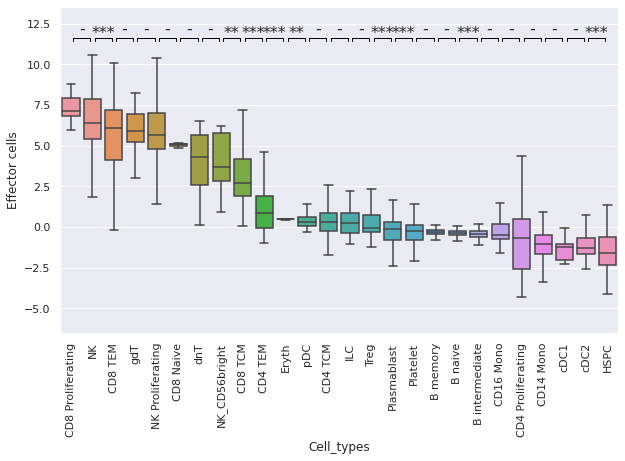

In [150]:
ax = boxplot_with_pvalue(cprocesses_sc[signature_name], df_all["Cell_types"], order = df_median.index, swarm=False,
                   figsize = [10, 6])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)

### UMAP plots

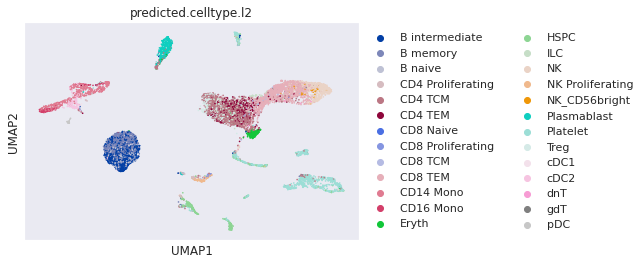

In [151]:
sc.pl.umap(adata, color=[celltype_col])

In [152]:
# If this returns False, report it to the developer of the notebook
all(cprocesses_sc.index == adata.obs_names)

True

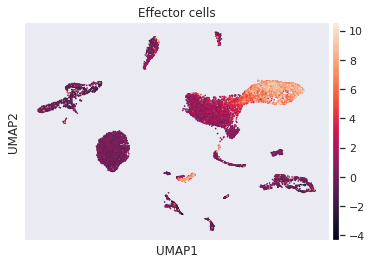

In [153]:
#umap with ssgsea score
adata.obs[signature_name] = cprocesses_sc[signature_name]
sc.pl.umap(adata, color=[signature_name])

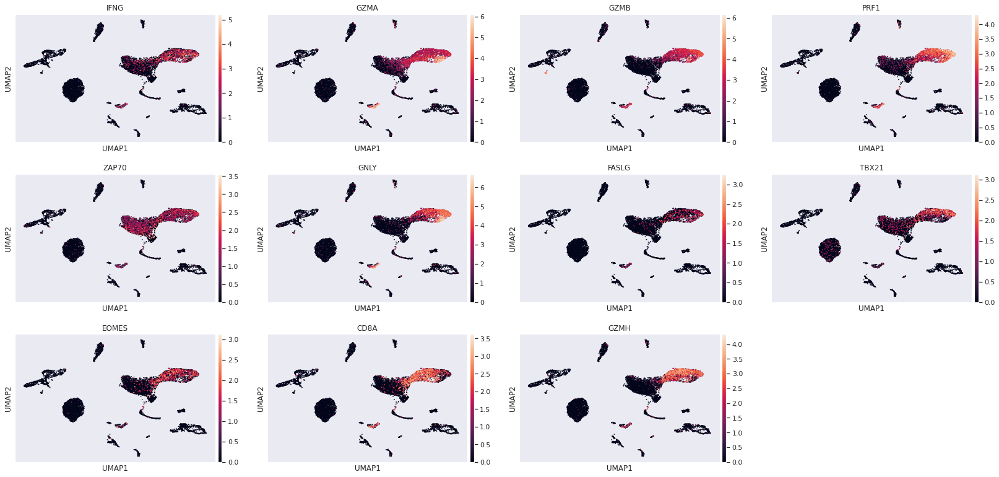

In [154]:
#umap with custom genes (ln expressions)
genes_of_interest = ['IFNG', 'GZMA', 'GZMB', 'PRF1', 'ZAP70', 'GNLY', 'FASLG', 'TBX21', 'EOMES', 'CD8A', 'GZMH']
sc.pl.umap(adata, color=genes_of_interest)

In [155]:
import plotly.express as px

tsne_repr_mean_var_lab = pd.DataFrame(adata.obsm['X_umap'])
tsne_repr_mean_var_lab.index = cgenes.columns
tsne_repr_mean_var_lab['Cell_types'] = cprocesses_sc['Cell_types'].reindex(tsne_repr_mean_var_lab.index)
tsne_repr_mean_var_lab[signature_name] = cprocesses_sc[signature_name].reindex(tsne_repr_mean_var_lab.index)


fig = px.scatter(tsne_repr_mean_var_lab, x=0, y=1, color=signature_name, 
                 title='UMAP plot',hover_data=['Cell_types'] )
fig.show('notebook')